In [1]:
# %matplotlib notebook

%matplotlib inline

In [2]:
import pandas as pd
import numpy as np
import anndata as ad
import scanpy as sc
import squidpy as sq

from load_data import save_anndata, load_anndata

from synthesize import SyntheticDataset, sample_gaussian, sample_truncated_gaussian, sample_2D_points, synthesize_metagenes
from scipy.stats import gamma, bernoulli, truncnorm
from pathlib import Path

import matplotlib.pyplot as plt
import random
import seaborn as sns

In [3]:
from importlib import reload
import synthesize
reload(synthesize)

<module 'synthesize' from '/work/magroup/shahula/spatiotemporal_transcriptomics_integration/SpiceMixPlus/SpiceMix/synthesize.py'>

## Simulating spatial patterns

In [4]:
from scipy.spatial import KDTree

class DomainKDTree():
    """Wrapper of KDTree for spatial domain simulation.
    
    """
    
    def __init__(self, landmarks, domain_labels):
        self.kd_tree = KDTree(data=landmarks, copy_data=True)
        self.domain_labels = np.array(domain_labels)
        
    def query(self, coordinates):
        distances, indices = self.kd_tree.query(coordinates)
        return self.domain_labels[indices]

### Using KD tree to create layer-like structure

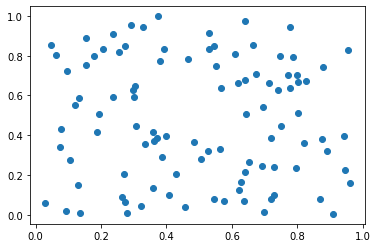

In [5]:
points = sample_2D_points(100, 0.02)
l1 = points[:, 0] < 0.33
l2 = ~l1 & (points[:, 0] < 0.66)
l3 = points[:, 0] > 0.66
plt.scatter(*points.T)

In [6]:
domain_labels = np.zeros(len(points), dtype="<U4")
domain_labels[l1] = "l1"
domain_labels[l2] = "l2"
domain_labels[l3] = "l3"
domain_kd_tree = DomainKDTree(points, domain_labels)

<AxesSubplot:xlabel='x', ylabel='y'>

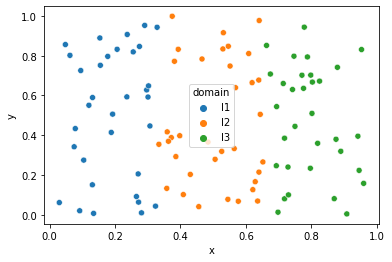

In [7]:
landmark_dataframe = pd.DataFrame(data=points, columns=["x", "y"])
landmark_dataframe["domain"] = domain_labels
sns.scatterplot(data=landmark_dataframe, x="x", y="y", hue="domain")

<AxesSubplot:xlabel='x', ylabel='y'>

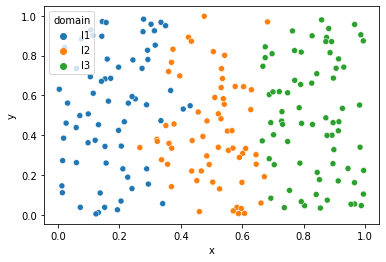

In [8]:
test_coordinates = sample_2D_points(200, 0.01)
queried_labels = domain_kd_tree.query(test_coordinates)
test_dataframe = pd.DataFrame(data=test_coordinates, columns=["x", "y"])
test_dataframe["domain"] = queried_labels
sns.scatterplot(data=test_dataframe, x="x", y="y", hue="domain")

### Simulating Visium

In [9]:
visium = sq.datasets.visium_hne_adata("../../data/visium/hne.h5ad")

In [10]:
slideseqv2 = sq.datasets.slideseqv2("../../data/slideseqv2/slideseqv2.h5ad")

In [11]:
visium

AnnData object with n_obs × n_vars = 2688 × 18078
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden', 'cluster'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'cluster_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'spatial', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

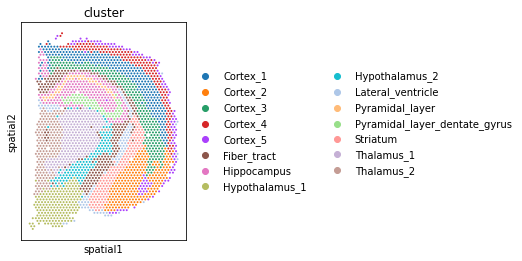

In [12]:
fig, ax = plt.subplots()

sc.pl.spatial(visium, color="cluster", img_key=None, ax=ax)

In [13]:
landmarks = visium.obsm["spatial"]
labels = visium.obs["cluster"]

dimensions = landmarks.ptp(axis=0)
lower_boundaries = landmarks.min(axis=0)
test_coordinates = sample_2D_points(5000, 0.01)

scaled_coordinates = test_coordinates * dimensions.T + lower_boundaries

visium_kd_tree = DomainKDTree(landmarks, labels)

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  This is separate from the ipykernel package so we can avoid doing imports until


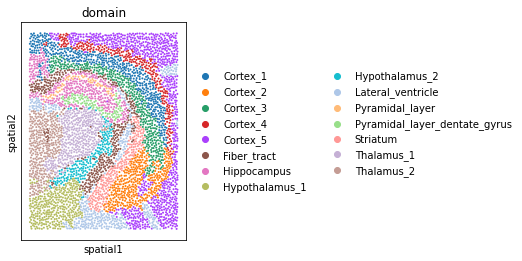

In [14]:
queried_labels = visium_kd_tree.query(scaled_coordinates)

test_dataframe = ad.AnnData(X=test_coordinates)
test_dataframe.obsm["spatial"] = scaled_coordinates
test_dataframe.obs["domain"] = queried_labels
test_dataframe.uns["spatial"] = visium.uns["spatial"]
sc.pl.spatial(test_dataframe, color="domain", img_key=None)

## Using ipycanvas to annotate spatial domains

Installation is not that simple, but see below:

In [21]:

!jupyter nbextension install --py --symlink --sys-prefix ipycanvas --user
!jupyter nbextension enable --py ipycanvas

Installing /home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipycanvas/nbextension/static -> ipycanvas
cannot specify more than one of user, sys_prefix, prefix, or nbextensions_dir, but got: user=True, sys_prefix=True
Enabling notebook extension ipycanvas/extension...
      - Validating: OK


In [15]:
from ipycanvas import Canvas, hold_canvas
from ipywidgets import Output
import numpy as np

In [16]:
# Test
n_particles = 100_000

x = np.array(np.random.rayleigh(250, n_particles), dtype=np.int32)
y = np.array(np.random.rayleigh(250, n_particles), dtype=np.int32)
size = np.random.randint(1, 3, n_particles)

width = 800
height = 500
canvas = Canvas(width=width, height=height)

canvas.layout.width = f"{width // 16}px"
canvas.layout.height = f"{height // 16}px"
    
canvas.fill_style = "green"
canvas.fill_rects(x, y, size)

canvas

Canvas(layout=Layout(height='31px', width='50px'), width=800)

In [20]:
landmarks = visium.obsm["spatial"]
labels = visium.obs["cluster"]

dimensions = landmarks.ptp(axis=0)
lower_boundaries = landmarks.min(axis=0)
test_coordinates = sample_2D_points(5000, 0.01)

scaled_coordinates = test_coordinates * dimensions.T + lower_boundaries

visium_kd_tree = DomainKDTree(landmarks, labels)

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  This is separate from the ipykernel package so we can avoid doing imports until


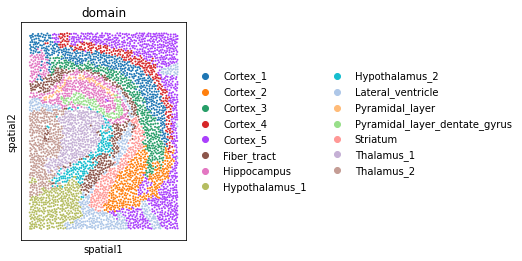

In [21]:
queried_labels = visium_kd_tree.query(scaled_coordinates)

test_dataframe = ad.AnnData(X=test_coordinates)
test_dataframe.obsm["spatial"] = scaled_coordinates
test_dataframe.obs["domain"] = queried_labels
test_dataframe.uns["spatial"] = visium.uns["spatial"]
sc.pl.spatial(test_dataframe, color="domain", img_key=None)

In [17]:
from ipycanvas import Canvas, hold_canvas
from ipywidgets import Output
from collections import defaultdict

class DomainCanvas():
    """Annotate spatial domains on a reference ST dataset and use to define domains for simulations.
    
    """
    
    def __init__(self, points, domain_names, canvas_width=400, density=10):
        """Constructor
        
        Args:
            points (nd.array): background points to use as reference for domain annotation
            domain_names (list of str): list of domains that will be annotated
            canvas_width (int): display width of canvas in Jupyter Notebook, in pixels
            density (float): Try 1 for Visium and 4 for Slide-seq V2
            
        """
        self.points = points
        self.domain_names = domain_names
        self.domain_option_string = "\n".join(f"{index}: {domain}" for index, domain in enumerate(self.domain_names))
        self.domain_deletion_string = \
            "This domain has already been annotated. What would you like to do? (enter 0 or 1) \n" \
            "0: Further annotate it\n" \
            "1: Delete the existing annotation and start from scratch\n"       
        
        dimensions = self.points.ptp(axis=0)
        lower_boundaries = self.points.min(axis=0)
        self.width, self.height = dimensions + lower_boundaries
 
        self.canvas_width = canvas_width
        self.canvas_height = int((self.height / self.width) * self.canvas_width)

        self.scaling_factor = self.canvas_width / self.width
        
        self.canvas = Canvas(width=self.width * self.scaling_factor, height=self.height * self.scaling_factor)

        self.canvas.layout.width = f"{self.canvas_width}px"
        self.canvas.layout.height = f"{self.canvas_height}px"
        
        self.density = density
        self.radius = 6 / self.density       
        self.canvas.line_width = 2.5 / self.density
        
        self.render_reference_points()
        
        self.domains = defaultdict(list)
        self.colors = {}
        self.out = self.bind_canvas()
        
        return
    
    def render_reference_points(self):
        x, y = self.points.T * self.scaling_factor

        self.canvas.stroke_style = "gray"
        self.canvas.stroke_circles(x, y, self.radius)
        
    def redraw(self):
        self.canvas.clear()
        self.render_reference_points()
        self.load_domains(self.domains)
        
    def bind_canvas(self):
        """Bind mouse click to canvas.
        
        Only used during initialization.
        """
        out = Output()

        @out.capture()
        def handle_mouse_down(x, y):
            with hold_canvas():
                self.canvas.sync_image_data=True
                self.canvas.stroke_circle(x, y, self.radius)
                self.canvas.fill_circle(x, y, self.radius)
                self.canvas.stroke()
                self.canvas.fill()
                self.canvas.sync_image_data=False
                
            self.domains[self.current_domain].append((x / self.scaling_factor, y / self.scaling_factor))
            return

        self.canvas.on_mouse_down(handle_mouse_down)
        
        return out

    def display(self):
        """Display editable canvas.
        
        Click to add landmarks for the domain self.current_domain.
        
        """
        display(self.out)
        return self.canvas
    
    def annotate_domain(self):
        """Create a new domain and display the canvas for annotation.
        
        """
        domain_index = int(input(
            "Choose a domain to annotate (enter an integer):\n"
            f"{self.domain_option_string}\n"
        ))
        if not (0 <= domain_index < len(self.domain_names)):
            raise ValueError(f"`{domain_index}` is not a valid index.")
                                              
        self.current_domain = self.domain_names[domain_index]
        
        if self.current_domain in self.colors:
            start_afresh = int(input(self.domain_deletion_string))
            if start_afresh not in (0, 1):
                raise ValueError(f"`{start_afresh}` is not a valid option.")
                
            if start_afresh:
                del self.domains[self.current_domain]
                self.redraw()
                
            color = self.colors[self.current_domain]

        else:
            r, g, b = np.random.randint(0, 255, size=3)
            color = f"rgb({r}, {g}, {b})"
            self.colors[self.current_domain] = color
            
        self.canvas.stroke_style = color
        self.canvas.fill_style = color
        
        return self.display()
    
    def load_domains(self, domains):
        """Load and display a pre-defined set of domains.
        
        """

        for domain_name in domains:
            self.domains[domain_name] = domains[domain_name]
            coordinates = domains[domain_name]
            
            if domain_name in self.colors:
                color = self.colors[domain_name]
            else:
                r, g, b = np.random.randint(0, 255, size=3)
                color = f"rgb({r}, {g}, {b})"
                self.colors[domain_name] = color

            self.canvas.stroke_style = color
            self.canvas.fill_style = color
            
            x, y = np.array(coordinates).T * self.scaling_factor
            self.canvas.stroke_circles(x, y, self.radius)
            self.canvas.fill_circles(x, y, self.radius)
    
    def generate_domain_kd_tree(self):
        """Export annotated dataset to KD-tree.
        
        """
        domains, coordinates = zip(*self.domains.items())

        domain_labels = [[domain] * len(coordinate) for domain, coordinate in zip(domains, coordinates)]

        flattened_domain_labels = np.concatenate(domain_labels)
        flattened_coordinates = np.concatenate(coordinates)
        annotated_domain_kd_tree = DomainKDTree(flattened_coordinates, flattened_domain_labels)
        
        return annotated_domain_kd_tree

### Example with Visium data

In [694]:
points = visium.obsm["spatial"]
lower_boundaries = points.min(axis=0)
points -= lower_boundaries

domain_names = ["L1", "L2"]
domain_canvas = DomainCanvas(points, domain_names, canvas_width=600, density=1)

In [699]:
domain_canvas.annotate_domain()

Choose a domain to annotate (enter an integer):
0: L1
1: L2
1
This domain has already been annotated. What would you like to do? (enter 0 or 1) 
0: Further annotate it
1: Delete the existing annotation and start from scratch
0


Output()

Canvas(height=793, image_data=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x02X\x00\x00\x03\x19\x08\x06\x00\x…

In [272]:
annotated_domains_kd_tree = domain_canvas.generate_domain_kd_tree()

In [152]:
dimensions = domain_canvas.points.ptp(axis=0)
test_coordinates = sample_2D_points(5000, 0.01)
scaled_coordinates = test_coordinates * dimensions.T

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  This is separate from the ipykernel package so we can avoid doing imports until


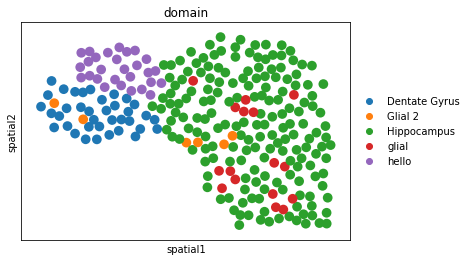

In [153]:
queried_labels = annotated_domains_kd_tree.query(scaled_coordinates)

test_dataframe = ad.AnnData(X=test_coordinates)
test_dataframe.obsm["spatial"] = scaled_coordinates
test_dataframe.obs["domain"] = queried_labels
test_dataframe = test_dataframe[test_dataframe.obs["domain"] != "N/A"]
test_dataframe.uns["spatial"] = visium.uns["spatial"]
sc.pl.spatial(test_dataframe, color="domain", img_key=None)

## Simulating expression

In [18]:
def synthesize_average_expressions(num_genes, cell_type_variation_probabilities, shape_parameter, normalize=True):
    """Synthesize related metagenes according to the metagene_variation_probabilities vector.

    """
    
    num_cell_type_components = len(cell_type_variation_probabilities) 
    expression_profiles = np.zeros((num_cell_type_components, num_genes))
    
    for index in range(num_cell_type_components):
        variation_probability = cell_type_variation_probabilities[index]
        if variation_probability == 0:
            expression_profile = gamma.rvs(shape_parameter, size=num_genes)
            expression_profiles[index] = expression_profile
        else:
            rng = np.random.default_rng()
            mask = rng.choice(num_genes, size=int(num_genes * variation_probability), replace=False)

            perturbed_expression_profile = np.array(expression_profile)
            perturbed_expression_profile[mask] = gamma.rvs(shape_parameter, size=len(mask))
        
            expression_profiles[index] = perturbed_expression_profile
        
            
    print("Difference between Inhibitory 1 and Inhibitory 2: %f" % ((expression_profiles[0] != expression_profiles[1]).sum() / num_genes))
    print("Difference between Non-Neuron L1 and Non-Neuron Ubiquitous: %f" % ((expression_profiles[2] != expression_profiles[3]).sum() / num_genes))
    print("Difference between Excitatory L1 and Excitatory L2: %f" % ((expression_profiles[4] != expression_profiles[5]).sum() / num_genes))
    print("Difference between Excitatory L3 and Excitatory L2: %f" % ((expression_profiles[6] != expression_profiles[5]).sum() / num_genes))
    print("Difference between Excitatory L1 and Excitatory L4: %f" % ((expression_profiles[4] != expression_profiles[7]).sum() / num_genes))
    print("Difference between Excitatory L3 and Excitatory L4: %f" % ((expression_profiles[6] != expression_profiles[7]).sum() / num_genes))

    return expression_profiles

In [19]:
layer_distributions = {
    "L1": {
        "Excitatory L1": 0.33,
        "Inhibitory 1": 0.1,
        "Non-Neuron L1": 0.5,
        "Non-Neuron Ubiquitous": 0.07
    },
    "L2": {
        "Excitatory L2": 0.93,
        "Non-Neuron Ubiquitous": 0.07
    },
    "L3": {
        "Excitatory L3": 0.53,
        "Inhibitory 1": 0.1,
        "Inhibitory 2": 0.3,
        "Non-Neuron Ubiquitous": 0.07
    },
    "L4": {
        "Excitatory L4": 0.73,
        "Inhibitory 1": 0.1,
        "Inhibitory 2": 0.1,
        "Non-Neuron Ubiquitous": 0.07
    },
}
# layer_distributions = [
#     pd.Series(data=
#         dict(zip(["Excitatory L1", "Inhibitory 1", "Non-Neuron L1", "Non-Neuron Ubiquitous"],
#                  [0.33, 0.1, 0.5, 0.07]))),
#     pd.Series(data=
#         dict(zip(["Excitatory L2","Non-Neuron Ubiquitous"],
#                  [0.93, 0.07]))),
#     pd.Series(data=
#         dict(zip(["Excitatory L3", "Inhibitory 1", "Inhibitory 2", "Non-Neuron Ubiquitous"],
#                  [0.53, 0.1, 0.3, 0.07]))),
#     pd.Series(data=
#         dict(zip(["Excitatory L4", "Inhibitory 1", "Inhibitory 2", "Non-Neuron Ubiquitous"],
#                  [0.73, 0.1, 0.1, 0.07]))),        
# ]
# layer_distributions = [distribution for key, distribution in pd.concat(layer_distributions, axis=1).fillna(0).iteritems()]
# layer_distributions

## Describe simulation domains

In [28]:
num_cells = 500
minimum_distance = 0.75 / np.sqrt(num_cells)
simulation_coordinates = sample_2D_points(num_cells, minimum_distance)


domain_names = ["L1", "L2", "L3", "L4"]

simulation_domain_canvas = DomainCanvas(simulation_coordinates, domain_names, density=1)

In [29]:
simulation_domain_canvas.annotate_domain()

Choose a domain to annotate (enter an integer):
0: L1
1: L2
2: L3
3: L4



ValueError: invalid literal for int() with base 10: ''

In [30]:
simulation_domain_canvas.annotate_domain()

KeyboardInterrupt: Interrupted by user

In [498]:
simulation_domain_canvas.annotate_domain()

Enter name of spatial domain (type "done" to quit):L3


Output()

Canvas(height=399, image_data=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x01\x90\x00\x00\x01\x8f\x08\x06\x0…

In [531]:
simulation_domain_canvas.annotate_domain()

Enter name of spatial domain (type "done" to quit):Glial L1


Output()

Canvas(height=399, image_data=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x01\x90\x00\x00\x01\x8f\x08\x06\x0…

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  """


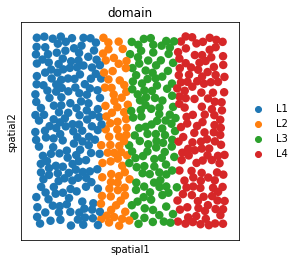

In [530]:
simulation_kd_tree = simulation_domain_canvas.generate_domain_kd_tree()

queried_labels = simulation_kd_tree.query(simulation_coordinates)

simulation_dataframe = ad.AnnData(X=simulation_coordinates)
simulation_dataframe.obsm["spatial"] = simulation_coordinates
simulation_dataframe.obs["domain"] = queried_labels

sc.pl.spatial(test_dataframe, color="domain", img_key=None, size=0.0005)

In [20]:
def synthesize_cell_embeddings(layer_labels, distributions, cell_type_definitions, num_cells, num_real_metagenes, n_noise_metagenes=3, signal_sigma_x=0.1, background_sigma_x=0.03, sigma_x_scale=1.0):
    """Generate synthetic cell embeddings.
    
    """
    
    num_metagenes = num_real_metagenes + n_noise_metagenes
    
    sigma_x = np.concatenate([np.full(num_real_metagenes, signal_sigma_x), np.full(n_noise_metagenes, background_sigma_x)])
    sigma_x = sigma_x * sigma_x_scale

    cell_type_assignments = np.zeros((num_cells), dtype='int')
    Z = np.zeros((num_cells, num_metagenes))
    X = np.zeros((num_cells, num_metagenes))
    
    cell_types = cell_type_definitions.keys()
    
    for layer_index, (layer_name, distribution) in enumerate(distributions.items()):
        layer_cells = layer_labels == layer_name
        distribution = distributions[layer_name]
        layer_cell_types, proportions = zip(*distribution.items())
        
        cell_indices, = np.nonzero(layer_cells)
        random.shuffle(cell_indices)

        partition_indices = (np.cumsum(proportions) * len(cell_indices)).astype(int)
        partitions = np.split(cell_indices, partition_indices[:-1])


        cell_type_to_partition = dict(zip(layer_cell_types, partitions))
        
        for cell_type_index, cell_type in enumerate(cell_types):
            if cell_type not in layer_cell_types:
                continue
                
            partition = cell_type_to_partition[cell_type]
            if len(partition) == 0:
                continue
            
            cell_type_assignments[partition] = cell_type_index
            Z[partition, :num_real_metagenes] = cell_type_definitions[cell_type]
        
   
    # Extrinsic factors
    Z[:, num_real_metagenes:num_metagenes] = 0.05

    # TODO: vectorize
    for cell in range(num_cells):
        for metagene in range(num_metagenes):
            X[cell, metagene] = sigma_x[metagene] * truncnorm.rvs(-Z[cell, metagene]/sigma_x[metagene], 100) + Z[cell, metagene]
    
    X = project_embeddings(X).T
    
    return X, cell_type_assignments

In [21]:
def project_embeddings(X):
    X = X * (X > 0)
    X = X / np.sum(X, axis=1, keepdims=True)
    
    return X

In [35]:
# cell_type_names = [
#     "Excitatory L1",
#     "Excitatory L2",
#     "Excitatory L3",
#     "Excitatory L4",
#     "Non-Neuron L1",
#     "Non-Neuron Ubiquitous",
#     "Inhibitory 1",
#     "Inhibitory 2",
# ]

class SyntheticDataset(ad.AnnData):
    """Simulated spatial transcriptomics dataset.
    
    Uses AnnData as a base class, with additional methods for simulation.
    """
    
    def __init__(self, num_cells, num_genes, replicate_name, distributions, cell_type_definitions, metagene_variation_probabilities,
                 domain_landmarks=None, shared_metagenes=None):
        """Generate random coordinates (as well as expression values) for a single ST FOV.
        
        """
        self.num_cells = num_cells
        self.num_genes = num_genes
        
        dummy_expression = np.zeros((num_cells, num_genes))
        
        ad.AnnData.__init__(self, X=dummy_expression)
        
        self.name = f"{replicate_name}"
        
        self.uns["layer_names"] = list(distributions.keys())
        self.uns["cell_type_names"] = list(cell_type_definitions.keys())
            
        self.uns["domain_landmarks"] = {
            self.name: domain_landmarks
        }
        self.uns["domain_distributions"] = {
            self.name: distributions
        }
        self.uns["metagene_variation_probabilities"] = {
            self.name: metagene_variation_probabilities
        }
        self.uns["cell_type_definitions"] = {
            self.name: cell_type_definitions
        }
        
#         simulation_coordinates = sample_2D_points(num_cells, minimum_distance)
        
        minimum_distance = 0.75 / np.sqrt(self.num_cells)
        tau = minimum_distance * 2.2
        
        self.obsm["spatial"] = sample_2D_points(self.num_cells, minimum_distance)
        self.domain_canvas = DomainCanvas(self.obsm["spatial"], self.uns["layer_names"], canvas_width=600, density=1)
        
    def simulate_expression(self, mode="metagene_based", **simulation_parameters, ):
        if mode == "metagene_based":
            return self.simulate_metagene_based_expression(**simulation_parameters)
        elif mode == "predefined":
            pass
    
    def simulate_metagene_based_expression(self, num_real_metagenes, num_noise_metagenes, real_metagene_parameter, noise_metagene_parameter,
                                           sigY_scale, lambda_s):
        """TySc
        
        """
        
        # Get num_genes x num_genes covariance matrix
        self.sig_y = sigY_scale
        num_metagenes = num_real_metagenes + num_noise_metagenes
        if isinstance(self.sig_y, float):
            self.sig_y *= np.identity(self.num_genes) / self.num_genes
            self.variance_y = (self.sig_y**2)
        elif isinstance(self.sig_y, dict):
            self.sig_y = {cell_type: cell_specific_sig_y / self.num_genes for cell_type, cell_specific_sig_y in self.sig_y.items()}
            random_key = next(iter(self.sig_y))
            if isinstance(self.sig_y[random_key], float):
                self.sig_y = {cell_type: cell_specific_sig_y * np.identity(self.num_genes) for cell_type, cell_specific_sig_y in self.sig_y.items()}
            
            self.variance_y = {cell_type: cell_specific_sig_y ** 2 for cell_type, cell_specific_sig_y in self.sig_y.items()}
            
        self.uns["ground_truth_M"] = {self.name: synthesize_metagenes(self.num_genes, num_real_metagenes,
                num_noise_metagenes, real_metagene_parameter, noise_metagene_parameter, metagene_variation_probabilities=self.uns["metagene_variation_probabilities"][self.name
                ])
            }
        
        X_i, C_i = synthesize_cell_embeddings(self.obs["layer"].to_numpy(), self.uns["domain_distributions"][self.name], self.uns["cell_type_definitions"][self.name],
                       self.num_cells, num_real_metagenes, n_noise_metagenes=num_noise_metagenes)

        self.S = gamma.rvs(num_metagenes, scale=lambda_s, size=self.num_cells)
        self.obsm["ground_truth_X"] = (X_i * self.S).T
        cell_type_encoded = C_i.astype(int)
        cell_type = [self.uns["cell_type_names"][index] for index in cell_type_encoded]
        self.obs["cell_type"] = cell_type
        self.obs["cell_type_encoded"] = cell_type_encoded

        self.X = np.matmul(self.obsm["ground_truth_X"], self.uns["ground_truth_M"][self.name])

        self.sample_noisy_expression()
            
    def sample_noisy_expression(self):
        for cell, cell_type in zip(range(self.num_cells), self.obs["cell_type_encoded"].to_numpy()):
            if isinstance(self.variance_y, dict):
                cell_type_variance_y = self.variance_y[int(cell_type)]
            else:
                cell_type_variance_y = self.variance_y

            # Ensure that gene expression is positive
            self.X[cell] = np.abs(sample_gaussian(cell_type_variance_y, self.X[cell]))
            
    def annotate_layer(self):
        return self.domain_canvas.annotate_domain()
        
    def assign_layer_labels(self):
        domain_kd_tree = self.domain_canvas.generate_domain_kd_tree()
        self.obs["layer"] = domain_kd_tree.query(self.obsm["spatial"])
        self.uns["domain_landmarks"] = self.domain_canvas.domains
        

In [23]:
cell_type_definitions = {
    "Excitatory L1":         [1, 0, 0, 0, 0, 0, 1, 0, 0, 0],
    "Excitatory L2":         [1, 0, 0, 0, 0, 0, 0, 1, 0, 0],
    "Excitatory L3":         [1, 0, 0, 0, 0, 0, 0, 0, 1, 0],
    "Excitatory L4":         [1, 0, 0, 0, 0, 0, 0, 0, 0, 1],
    "Inhibitory 1":          [0, 1, 1, 0, 0, 0, 0, 0, 0, 0],
    "Inhibitory 2":          [0, 1, 0, 1, 0, 0, 0, 0, 0, 0],
    "Non-Neuron L1":         [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
    "Non-Neuron Ubiquitous": [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
}

simulation_parameters = {
#     "name": f"{variance_option}_variance_{beta_option}_covariance_{replicate_variability}_replicate_variability_random_seed_{run}",
#     'num_cells': 500,
#     'num_genes': 100,
    'num_real_metagenes': 10,
    'num_noise_metagenes': 2,
#     'num_replicates': 4,
#     'sigY_scale': {
#         cell_type: covariance_matrix for cell_type, covariance_matrix in zip(range(len(cell_type_names)), covariance_matrices)
#     },
    'sigY_scale': 3.0,
#                 "gamma_shape": 4.0,
    "real_metagene_parameter": 4.0,
    "noise_metagene_parameter": 4.0,
    'lambda_s': 1.0,
#     "cell_type_names": cell_type_names,
#     "gene_replace_prob": 0,
#     "replicate_variability": replicate_variability
}

metagene_variation_probabilities = [0, 0.25, 0, 0.25, 0, 0.25, 0, 0.1, 0.1, 0.1]

In [ ]:
data = SyntheticDataset(500, 100, "0", layer_distributions, cell_type_definitions, metagene_variation_probabilities)

In [ ]:
data.annotate_layer()

In [1168]:
data.assign_layer_labels()

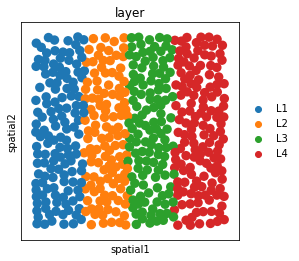

In [1169]:
sc.pl.spatial(data,
              color="layer",
              spot_size=0.05)

In [959]:
data.simulate_expression(**simulation_parameters)

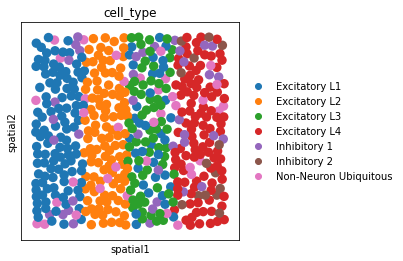

In [960]:
sc.pl.spatial(data,
              color="cell_type",
              spot_size=0.05)

In [1193]:
sc.pp.neighbors(data)
sc.tl.umap(data)

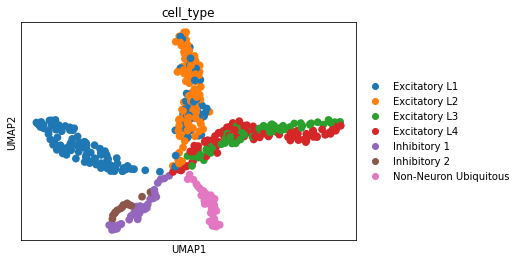

In [1194]:
sc.pl.umap(data,
           color="cell_type")

## Spatial batch effect simulation

In [36]:
class SpatialBatchEffectDataset(SyntheticDataset):
    """Simulation dataset with gradient-like batch effect.
    
    """
    def __init__(self, num_cells, num_genes, replicate_name, distributions, cell_type_definitions, metagene_variation_probabilities,
                 domain_landmarks=None, shared_metagenes=None):
        super().__init__(num_cells, num_genes, replicate_name, distributions, cell_type_definitions, metagene_variation_probabilities,
                 domain_landmarks, shared_metagenes)
        
    def simulate_expression(self, spatial_function, spatial_metagene_index, mode="metagene_based", **simulation_parameters):
        super().simulate_expression(**simulation_parameters)
        
        spatial_effect = spatial_function(self.obsm["spatial"])

        self.obsm["ground_truth_X"][:, spatial_metagene_index] += spatial_effect
        self.obsm["ground_truth_X"] = (project_embeddings(self.obsm["ground_truth_X"] / self.S[:, np.newaxis])) * self.S[:, np.newaxis]
        
        self.X = np.matmul(self.obsm["ground_truth_X"], self.uns["ground_truth_M"][self.name])
        self.sample_noisy_expression()

In [1454]:
batch_effect = SpatialBatchEffectDataset(500, 100, "0", layer_distributions, cell_type_definitions, metagene_variation_probabilities)

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.


In [1458]:
batch_effect.annotate_layer()

Choose a domain to annotate (enter an integer):
0: L1
1: L2
2: L3
3: L4
3


Output()

Canvas(height=600, image_data=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x02X\x00\x00\x02X\x08\x06\x00\x00\…

In [1465]:
batch_effect.assign_layer_labels()

def right_gradient(coordinates, alpha=0):
    return alpha * coordinates[:, 0]

batch_effect.simulate_expression(right_gradient, 9, **simulation_parameters)

In [51]:
def plot_metagene_embedding(synthetic_dataset, metagene_index):
    points = synthetic_dataset.obsm["spatial"]
    x, y = points.T
    spatial_effect = synthetic_dataset.obsm["ground_truth_X"][:, metagene_index]

    biased_batch_effect = pd.DataFrame({"x":x, "y":y, "spatial_metagene":spatial_effect})
    sns.scatterplot(data=biased_batch_effect, x="x", y="y", hue="spatial_metagene")
    
plot_metagene_embedding(batch_effect, 9)

NameError: name 'batch_effect' is not defined

NameError: name 'batch_effect' is not defined

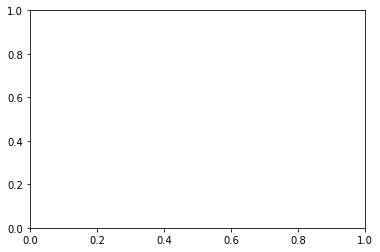

In [52]:
fig, ax = plt.subplots()
sc.pp.neighbors(batch_effect)
sc.tl.umap(batch_effect)
sc.pl.umap(batch_effect, color="cell_type", ax=ax)

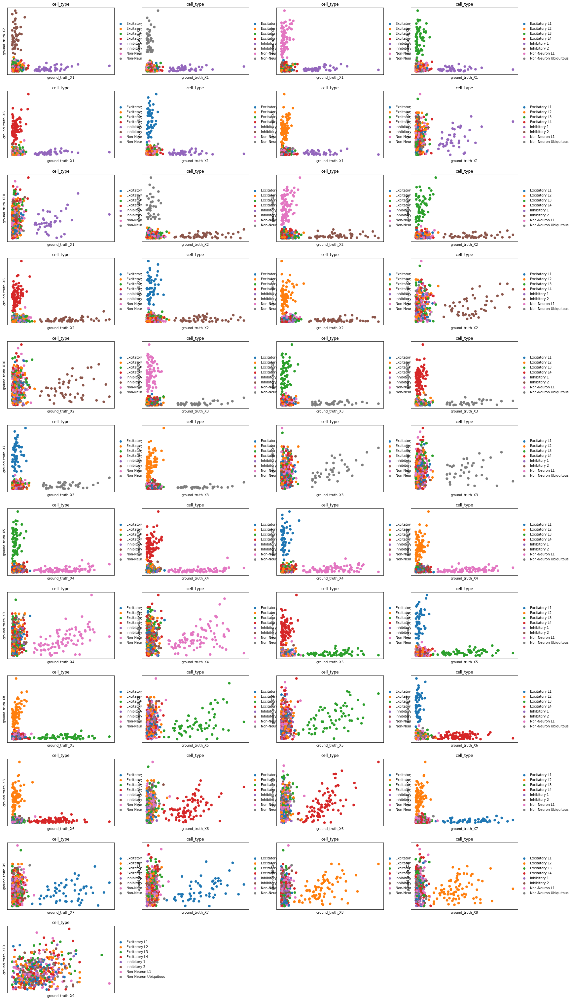

In [1468]:
sc.pl.embedding(batch_effect, color="cell_type",
                components="all",
                basis="ground_truth_X")

## Multireplicate simulation

In [37]:
from scipy.sparse import csr_matrix
def remove_connectivity_artifacts(sparse_distance_matrix):
    dense_distances = sparse_distance_matrix.toarray()
    distances = sparse_distance_matrix.data
    cutoff = np.percentile(distances, 94.5)
    mask = dense_distances < cutoff
    
    return csr_matrix(dense_distances * mask)

In [38]:
class MultiReplicateSyntheticDataset():
    """Synthetic multireplicate dataset to model biological variation and batch effects
    in spatial transcriptomics data.
    
    """
    
    def __init__(self, replicate_parameters, dataset_class): 
        self.datasets = {}
        self.replicate_parameters = replicate_parameters
        for replicate_name in self.replicate_parameters:
            synthetic_dataset = dataset_class(500, 100, replicate_name, **self.replicate_parameters[replicate_name])
            self.datasets[replicate_name] = synthetic_dataset
    
    def annotate_replicate_layer(self, replicate_name):
        print(f"Annotating replicate {replicate_name}")

        return self.datasets[replicate_name].annotate_layer()
    
    def assign_layer_labels(self):
        for replicate_dataset in self.datasets.values():
            replicate_dataset.assign_layer_labels()
            
    def simulate_expression(self, replicate_simulation_parameters):
        """Convenience method for shared simulation parameters between all replicates.
        
        """
        
        for replicate_name, replicate_dataset in self.datasets.items():
            simulation_paramaters = replicate_simulation_parameters[replicate_name]
            replicate_dataset.simulate_expression(**simulation_parameters)
            
    def calculate_neighbors(self):
        for replicate, dataset in self.datasets.items():
            sq.gr.spatial_neighbors(dataset, coord_type="generic", delaunay=True)
            dataset.obsp["spatial_connectivities"] = remove_connectivity_artifacts(dataset.obsp["spatial_distances"])
            dataset.obsp["adjacency_matrix"] = dataset.obsp["spatial_connectivities"]

In [1293]:
replicate_parameters = {
    "0": {
        "distributions": layer_distributions,
        "cell_type_definitions": cell_type_definitions,
        "metagene_variation_probabilities": metagene_variation_probabilities
    },
    "1": {
        "distributions": layer_distributions,
        "cell_type_definitions": cell_type_definitions,
        "metagene_variation_probabilities": metagene_variation_probabilities
    }
}

multireplicate_dataset = MultiReplicateSyntheticDataset(replicate_parameters, SyntheticDataset)

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.


In [1297]:
multireplicate_dataset.annotate_replicate_layer("0")

Annotating replicate 0
Choose a domain to annotate (enter an integer):
0: L1
1: L2
2: L3
3: L4
3


Output()

Canvas(height=600, image_data=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x02X\x00\x00\x02X\x08\x06\x00\x00\…

In [1298]:
annotated_domains = multireplicate_dataset.datasets["0"].domain_canvas.domains

multireplicate_dataset.datasets["1"].domain_canvas.load_domains(annotated_domains)

In [1299]:
multireplicate_dataset.datasets["1"].domain_canvas.display()

Output()

Canvas(height=601, layout=Layout(height='601px', width='600px'), width=600)

In [1300]:
multireplicate_dataset.assign_layer_labels()

In [1301]:
# Same parameters for each replicate (for now)
replicate_simulation_parameters = {
    "0": simulation_parameters,
    "1": simulation_parameters
}

multireplicate_dataset.simulate_expression(replicate_simulation_parameters)

         Falling back to preprocessing with `sc.pp.pca` and default params.


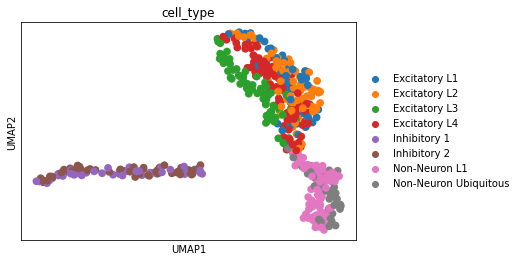

         Falling back to preprocessing with `sc.pp.pca` and default params.


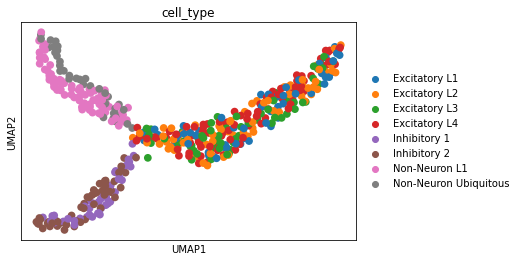

In [1302]:
for (replicate_name, replicate_dataset) in multireplicate_dataset.datasets.items():
    fig, ax = plt.subplots()
    sc.pp.neighbors(replicate_dataset)
    sc.tl.umap(replicate_dataset)
    sc.pl.umap(replicate_dataset, color="cell_type", ax=ax)

In [1286]:
! mkdir ../../data/synthetic_cortex/multireplicate_batch_effect_test/

mkdir: cannot create directory ‘../../data/synthetic_cortex/multireplicate_batch_effect_test/’: File exists


In [1304]:
(replicate_names, datasets) = zip(*multireplicate_dataset.datasets.items())

for dataset in datasets:
    sq.gr.spatial_neighbors(dataset, coord_type="generic", delaunay=True)
    dataset.obsp["spatial_connectivities"] = remove_connectivity_artifacts(dataset.obsp["spatial_distances"])
    dataset.obsp["adjacency_matrix"] = dataset.obsp["spatial_connectivities"]
        
save_anndata("../../data/synthetic_cortex/multireplicate_batch_effect_test/processed_dataset.h5ad", datasets, replicate_names)

/work/magroup/shahula/spatiotemporal_transcriptomics_integration/SpiceMixPlus/SpiceMix/load_data.py:144: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  obsp=dataset.obsp,
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 1000 × 100
    obs: 'layer', 'cell_type', 'cell_type_encoded', 'batch'
    uns: 'layer_names', 'cell_type_names', 'domain_landmarks', 'domain_distributions', 'metagene_variation_probabilities', 'cell_type_definitions', 'ground_truth_M', 'neighbors', 'umap', 'cell_type_colors', 'spatial_neighbors'
    obsm: 'spatial', 'ground_truth_X', 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities', 'spatial_connectivities', 'spatial_distances', 'adjacency_matrix'

In [1305]:
dataset.uns["spatial_neighbors"]

{'connectivities_key': 'spatial_connectivities',
 'distances_key': 'spatial_distances',
 'params': {'n_neighbors': 6,
  'coord_type': 'generic',
  'radius': None,
  'transform': None}}

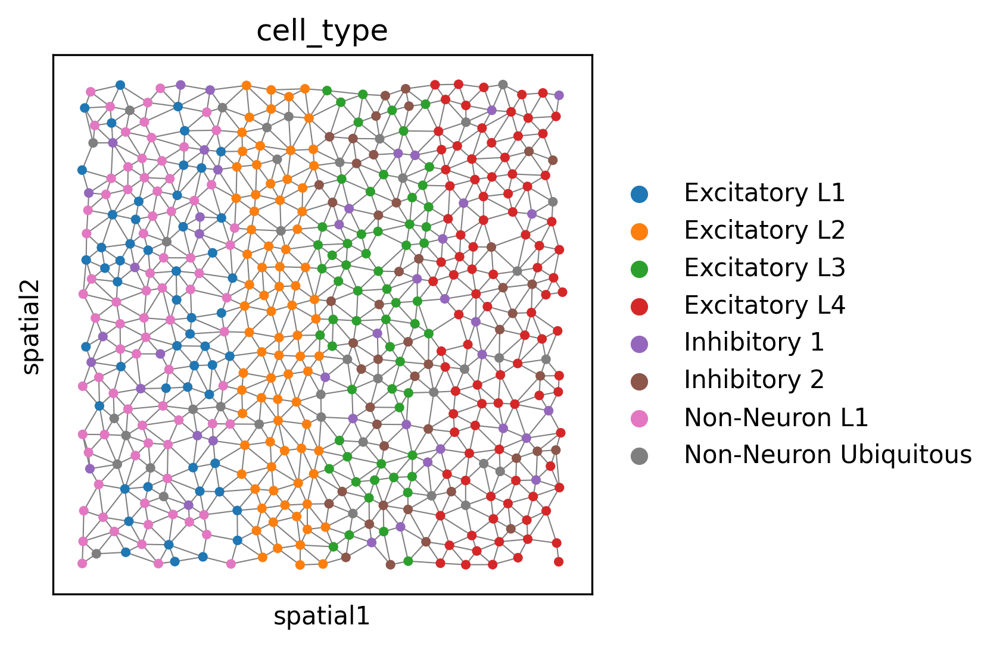

In [1570]:
fig, ax = plt.subplots(dpi=300)
sc.pl.spatial(datasets[0], spot_size=0.02, neighbors_key="spatial_neighbors",
              color="cell_type", edges=True,  edges_width=0.5, ax=ax)

##  Multireplicate batch effect simulation

In [94]:
replicate_parameters = {
    "0": {
        "distributions": layer_distributions,
        "cell_type_definitions": cell_type_definitions,
        "metagene_variation_probabilities": metagene_variation_probabilities
    },
    "1": {
        "distributions": layer_distributions,
        "cell_type_definitions": cell_type_definitions,
        "metagene_variation_probabilities": metagene_variation_probabilities
    },
    "2": {
        "distributions": layer_distributions,
        "cell_type_definitions": cell_type_definitions,
        "metagene_variation_probabilities": metagene_variation_probabilities
    }
}

def right_gradient(coordinates, alpha=0):
    return alpha * coordinates[:, 0]

def left_gradient(coordinates, alpha=0):
    return alpha * (1 - coordinates[:, 0])

def central_hotspot(coordinates, alpha=0):
    x, y = coordinates. T
    r = np.sqrt((x-0.5)**2 + (y-0.5)**2)
    return alpha / r

In [95]:
multireplicate_batch_effect = MultiReplicateSyntheticDataset(replicate_parameters, SpatialBatchEffectDataset)

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.


In [100]:
multireplicate_batch_effect.annotate_replicate_layer("0")

Annotating replicate 0
Choose a domain to annotate (enter an integer):
0: L1
1: L2
2: L3
3: L4
3


Output()

Canvas(height=600, image_data=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x02X\x00\x00\x02X\x08\x06\x00\x00\…

In [101]:
annotated_domains = multireplicate_batch_effect.datasets["0"].domain_canvas.domains

multireplicate_batch_effect.datasets["1"].domain_canvas.load_domains(annotated_domains)
multireplicate_batch_effect.datasets["2"].domain_canvas.load_domains(annotated_domains)

In [102]:
multireplicate_batch_effect.assign_layer_labels()
# Same parameters for each replicate (for now)

multireplicate_batch_effect.datasets["0"].simulate_expression(right_gradient, 11, **simulation_parameters)
multireplicate_batch_effect.datasets["1"].simulate_expression(left_gradient, 11, **simulation_parameters)
multireplicate_batch_effect.datasets["2"].simulate_expression(central_hotspot, 11, **simulation_parameters)

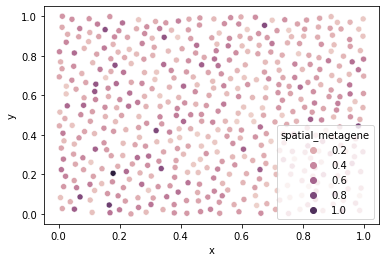

In [103]:
plot_metagene_embedding(multireplicate_batch_effect.datasets["0"], 11)

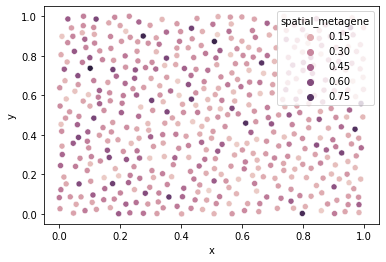

In [104]:
plot_metagene_embedding(multireplicate_batch_effect.datasets["1"], 11)

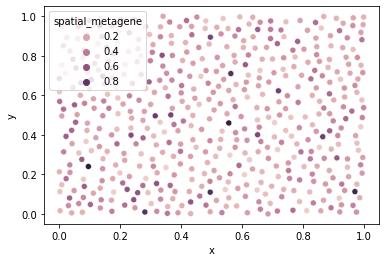

In [105]:
plot_metagene_embedding(multireplicate_batch_effect.datasets["2"], 11)

         Falling back to preprocessing with `sc.pp.pca` and default params.


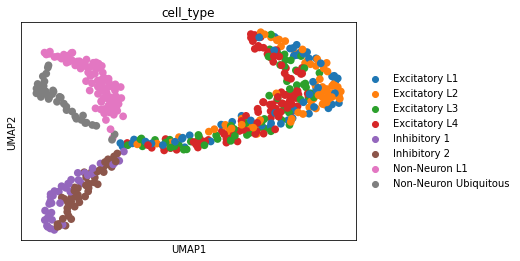

         Falling back to preprocessing with `sc.pp.pca` and default params.


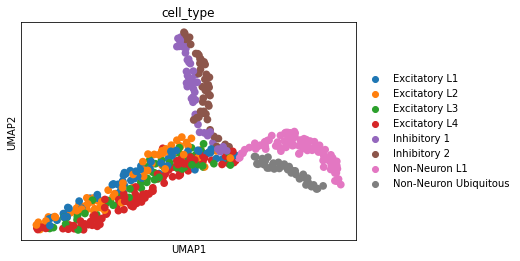

         Falling back to preprocessing with `sc.pp.pca` and default params.


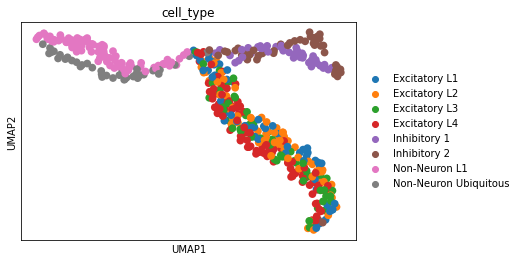

In [106]:
for (replicate_name, replicate_dataset) in multireplicate_batch_effect.datasets.items():
    fig, ax = plt.subplots()
    sc.pp.neighbors(replicate_dataset)
    sc.tl.umap(replicate_dataset)
    sc.pl.umap(replicate_dataset, color="cell_type", ax=ax)

In [90]:
print(sc.metrics.morans_i(multireplicate_batch_effect.datasets["0"], obsm="ground_truth_X"))
print(sc.metrics.morans_i(multireplicate_batch_effect.datasets["1"], obsm="ground_truth_X"))
print(sc.metrics.morans_i(multireplicate_batch_effect.datasets["2"], obsm="ground_truth_X"))

[0.83960996 0.75678192 0.443374   0.47151543 0.8429773  0.55719894
 0.33373804 0.25053023 0.176616   0.47346852 0.31226138 0.50605315]
[0.86834921 0.74110995 0.37065924 0.52804975 0.85218133 0.56283216
 0.22219614 0.15275897 0.20126898 0.42847573 0.29286583 0.49833437]
[0.8741738  0.74751105 0.47848206 0.47926182 0.75441083 0.40409049
 0.20483925 0.20554109 0.10521124 0.27984776 0.30167609 0.3481608 ]


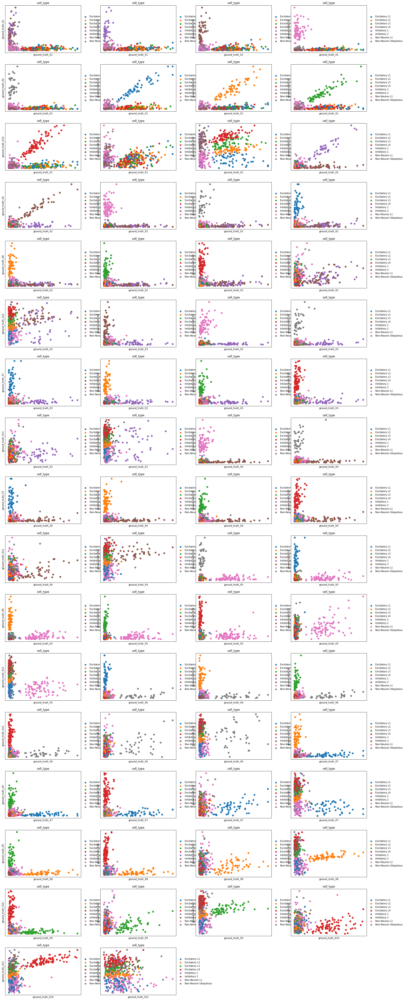

In [91]:
sc.pl.embedding(multireplicate_batch_effect.datasets["0"], color="cell_type",
                components="all",
                basis="ground_truth_X")

In [92]:
! mkdir ../../data/synthetic_cortex/multireplicate_spatial_batch_effect/

mkdir: cannot create directory ‘../../data/synthetic_cortex/multireplicate_spatial_batch_effect/’: File exists


In [93]:
multireplicate_batch_effect.calculate_neighbors()
(replicate_names, datasets) = zip(*multireplicate_batch_effect.datasets.items())
save_anndata("../../data/synthetic_cortex/multireplicate_spatial_batch_effect/processed_dataset.h5ad", datasets, replicate_names)

/work/magroup/shahula/spatiotemporal_transcriptomics_integration/SpiceMixPlus/SpiceMix/load_data.py:156: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  obsp=dataset.obsp,
/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 1500 × 100
    obs: 'layer', 'cell_type', 'cell_type_encoded', 'batch'
    uns: 'layer_names', 'cell_type_names', 'domain_landmarks', 'domain_distributions', 'metagene_variation_probabilities', 'cell_type_definitions', 'ground_truth_M', 'neighbors', 'umap', 'cell_type_colors', 'spatial_neighbors'
    obsm: 'spatial', 'ground_truth_X', 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities', 'spatial_connectivities', 'spatial_distances', 'adjacency_matrix'

In [ ]:
parent_directory = Path("../../data/synthetic_cortex")
num_runs = 2
datasets = []

for run in range(num_runs):
    np.random.seed(run)

    replicate_parameters = {
        "0": {
            "distributions": layer_distributions,
            "cell_type_definitions": cell_type_definitions,
            "metagene_variation_probabilities": metagene_variation_probabilities
        },
        "1": {
            "distributions": layer_distributions,
            "cell_type_definitions": cell_type_definitions,
            "metagene_variation_probabilities": metagene_variation_probabilities
        },
        "2": {
            "distributions": layer_distributions,
            "cell_type_definitions": cell_type_definitions,
            "metagene_variation_probabilities": metagene_variation_probabilities
        }
    }
    
    simulation_parameters = {
        'num_real_metagenes': 8,
        'num_noise_metagenes': 2,
        'sigY_scale': 3.0,
        "real_metagene_parameter": 4.0,
        "noise_metagene_parameter": 4.0,
        'lambda_s': 1.0,
    }

    print(parameters["name"])
    print(noise)

    subdirectory = parent_directory/ f'{parameters["num_cells"]}_cells_{parameters["num_genes"]}_genes_{parameters["name"]}'
    subdirectory.mkdir(parents=True, exist_ok=True)
    dataset = SyntheticCortexDataset(parameters, subdirectory)
    annotated_datasets = []
    for replicate in range(parameters["num_replicates"]):
        annotated_dataset = ad.AnnData(X=dataset.Y[replicate].T)
        annotated_dataset.obsm["spatial"] = dataset.points[replicate]
        annotated_dataset.obsp["adjacency_matrix"] = dataset.affinity_matrices[replicate]

        annotated_dataset.obsp["connectivities"] = annotated_dataset.obsp["adjacency_matrix"]
        annotated_dataset.uns["ground_truth_M"] = {f"{replicate}": dataset.metagenes[replicate]}
        annotated_dataset.uns["ground_truth_X"] = {f"{replicate}": dataset.cell_embeddings[replicate].T}
        cell_type = dataset.cell_types[replicate].astype(int)
        cell_type_encoded = [cell_type_names[index] for index in cell_type]
        annotated_dataset.obs = pd.DataFrame({"cell_type": cell_type, "cell_type_encoded": cell_type_encoded})
        annotated_datasets.append(annotated_dataset)
        datasets.append(dataset)

    merged_dataset = save_anndata(subdirectory / "processed_dataset.hdf5", annotated_datasets, range(parameters["num_replicates"]))
#             dataset.save_dataset()

# Old simulation code below; most (but not all) can be deleted 

In [9]:
class SyntheticCortexDataset(SyntheticDataset):
    """Synthetic mouse brain cortex dataset with circular pattterns.
    
    This class provides methods for initializing a semi-random mouse cortex spatial
    transcriptomics dataset, as well as methods to visualize aspects of the dataset.
    
    Data consists of 4 layers of widths [.35, .15, .25, .25]. Each layer has a
    unique excitatory neuronal type. There are three inhibitory neuronal
    types which have slight layer preferences. There are two layer-specific
    non-neuron types, one of which constitutes most of layer 2. There is a
    third non-neuron type, which is uniformly distributed throughout.
    0 - Excitatory L1
    1 - Excitatory L2
    2 - Excitatory L3
    3 - Excitatory L4
    4 - Inhibitory 1
    5 - Inhibitory 2
    6 - non-Neuron spatially variable
    7 - non-Neuron (ubiquitous)

    Metagenes
    0 - Excitatory
    1 - In
    2 - Inhibitory-1
    3 - Inhibitory-2
    4 - non-Neuron 1
    5 - non-Neuron 2
    6 - L3
    7 - L4
    8 - L1
    9 - L2
    10 - end - random
    """
    
    distributions = layer_distributions
    
    layer_widths = np.array([0.35, 0.15, 0.25, 0.25])# * np.sqrt(2)
    layer_endpoints = np.cumsum(layer_widths)
    
    mask_conditions = [
        (lambda coordinates: coordinates[:, 0] < SyntheticCortexDataset.layer_endpoints[0]),
#         *[(lambda coordinates: (np.linalg.norm(coordinates, axis=1) >= SyntheticAMBACortexDataset.layer_endpoints[layer])
#              & (np.linalg.norm(coordinates, axis=1) < SyntheticAMBACortexDataset.layer_endpoints[layer + 1]))
#             for layer in range(0, 7)
#          ],
        (lambda coordinates: (coordinates[:, 0] >= SyntheticCortexDataset.layer_endpoints[0])
             & (coordinates[:, 0] < SyntheticCortexDataset.layer_endpoints[1])),
        (lambda coordinates: (coordinates[:, 0] >= SyntheticCortexDataset.layer_endpoints[1])
             & (coordinates[:, 0] < SyntheticCortexDataset.layer_endpoints[2])),
        (lambda coordinates: coordinates[:, 0] >= SyntheticCortexDataset.layer_endpoints[2])
    ]
    
    cell_composition_variation_probabilities = [0, 0.1, 0, 0.1, 0, 0.05, 0.05, 0.01]
    
    cell_type_definitions = np.array([
        [   # Layer 1
            {"Excitatory L1": [0, 0, 0, 0, 0, 0, 1, 0],
             "Inhibitory 1": [1, 0, 0, 0, 0, 0, 0, 0],
             "Non-Neuron 2": [0, 0, 0, 1, 0, 0, 0, 0],
             "Non-Neuron Ubiquitous": [0, 0, 1, 0, 0, 0, 0, 0] 
            }
#             [0, 0, 0, 0, 0, 0, 1, 0],
#             [0, 0, 0, 0, 0, 0, 0, 0],
#             [0, 0, 0, 0, 0, 0, 0, 0],
#             [0, 0, 0, 0, 0, 0, 0, 0],
#             [1, 0, 0, 0, 0, 0, 0, 0], # Inhibitory 1
#             [0, 0, 0, 0, 0, 0, 0, 0],
#             [0, 0, 0, 1, 0, 0, 0, 0], # Non-Neuron 2
#             [0, 0, 1, 0, 0, 0, 0, 0] 
        ],
        [   # Layer 2
            {"Excitatory L2": [0, 0, 0, 0, 0, 0, 0, 1],
             "Non-Neuron Ubiquitous": [0, 0, 1, 0, 0, 0, 0, 0] 
            }
#             [0, 0, 0, 0, 0, 0, 0, 0],
#             [0, 0, 0, 0, 0, 0, 0, 1], # Excitatory L2
#             [0, 0, 0, 0, 0, 0, 0, 0],
#             [0, 0, 0, 0, 0, 0, 0, 0],
#             [0, 0, 0, 0, 0, 0, 0, 0],
#             [0, 0, 0, 0, 0, 0, 0, 0],
#             [0, 0, 0, 0, 0, 0, 0, 0],
#             [0, 0, 1, 0, 0, 0, 0, 0]   
        ],
        [   # Layer 3
            {"Excitatory L3": [0, 0, 0, 0, 1, 0, 0, 0],
             "Inhibitory 1": [1, 0, 0, 0, 0, 0, 0, 0],
             "Inhibitory 2": [0, 1, 0, 0, 0, 0, 0, 0],
             "Non-Neuron Ubiquitous": [0, 0, 1, 0, 0, 0, 0, 0] 
            }
#             [0, 0, 0, 0, 0, 0, 0, 0],
#             [0, 0, 0, 0, 0, 0, 0, 0],
#             [0, 0, 0, 0, 1, 0, 0, 0], # Excitatory L3
#             [0, 0, 0, 0, 0, 0, 0, 0],
#             [1, 0, 0, 0, 0, 0, 0, 0], # Inhibitory 1
#             [0, 1, 0, 0, 0, 0, 0, 0], # Inhibitory 2
#             [0, 0, 0, 0, 0, 0, 0, 0],
#             [0, 0, 1, 0, 0, 0, 0, 0]   
        ],
        [   # Layer 4
            {"Excitatory L4": [0, 0, 0, 0, 0, 1, 0, 0],
             "Inhibitory 1": [1, 0, 0, 0, 0, 0, 0, 0],
             "Inhibitory 2": [0, 1, 0, 0, 0, 0, 0, 0],
             "Non-Neuron Ubiquitous": [0, 0, 1, 0, 0, 0, 0, 0] 
            }
#             [0, 0, 0, 0, 0, 0, 0, 0],
#             [0, 0, 0, 0, 0, 0, 0, 0],
#             [0, 0, 0, 0, 0, 0, 0, 0],
#             [0, 0, 0, 0, 0, 1, 0, 0], # Excitatory L4
#             [1, 0, 0, 0, 0, 0, 0, 0], # Inhibitory 1
#             [0, 1, 0, 0, 0, 0, 0, 0], # Inhibitory 2
#             [0, 0, 0, 0, 0, 0, 0, 0],
#             [0, 0, 1, 0, 0, 0, 0, 0]   
        ]
    ])
    
    

    def __init__(self, parameters, parent_directory, key=''):
        num_genes = parameters["num_genes"]
        
        gene_names = ["Gene {}".format(gene) for gene in np.arange(num_genes)]

#         cell_composition_definitions = synthesize_metagenes(num_genes, SyntheticCortexDataset.cell_composition_variation_probabilities, parameters["gamma_shape"])
        
#         cell_type_definitions = [np.dot(cell_type_composition, cell_composition_definitions).T for cell_type_composition in SyntheticCortexDataset.cell_type_compositions]
#         cell_type_definitions = [make_cell_type_dataframe(cell_type_definition, layer_distribution.index)
#                                      for cell_type_definition, layer_distribution in zip(SyntheticCortexDataset.cell_type_definitions, layer_distributions)]
        super().__init__(SyntheticCortexDataset.distributions,
                         SyntheticCortexDataset.cell_type_definitions,
                         SyntheticCortexDataset.mask_conditions,
                         SyntheticCortexDataset.cell_composition_variation_probabilities,
                         parameters, parent_directory, key='')
        

In [11]:
##### Create Datasets
cell_type_names = [
    "Excitatory L1",
    "Excitatory L2",
    "Excitatory L3",
    "Excitatory L4",
    "Non-Neuron L1",
    "Non-Neuron Ubiquitous",
    "Inhibitory 1",
    "Inhibitory 2",
]

max_variances_low = np.array([
    3.0,
    5.0,
    5.0,
    5.0,
    5.0,
    5.0,
    4.0,
    3.0,
])

max_variances_medium = np.array([
    15.0,
    25.0,
    25.0,
    25.0,
    25.0,
    25.0,
    20.0,
    15.0,
])

max_variances_high = np.array([
    25.0,
    25.0,
    25.0,
    25.0,
    25.0,
    25.0,
    25.0,
    25.0,
])

max_variances_extreme = np.array([
    30.0,
    50.0,
    50.0,
    50.0,
    30.0,
    50.0,
    25.0,
    30.0,
])

def generate_symmetric_random_matrix(low, high, shape):
    rng = np.random.default_rng()
    matrix = rng.uniform(low, high, shape)
    
    return (matrix + matrix.T) / 2

def generate_covariance_matrix(max_variance, low, high, shape):
    rng = np.random.default_rng()
    
    covariance = generate_symmetric_random_matrix(low, high, shape)
    variance = rng.uniform(0, max_variance, shape[:1])
    
    covariance_matrix = covariance + np.identity(shape[0]) * variance
    plt.imshow(covariance_matrix)
    plt.show()
    
    return covariance_matrix

In [12]:
"""
Random Correlation matrix using the algorithm in LKJ 2009 (vine method based on a C-vine)
Created on Wed Aug  2 09:09:02 2017
@author: junpenglao
"""
import numpy as np
from scipy import stats

def lkj_random(n, beta, size=1):
#     beta = eta - 1 + n/2
    shape = n * (n-1) // 2
    triu_ind = np.triu_indices(n, 1)
    beta_parameters = np.array([beta - k/2 for k in triu_ind[0]])
    # partial correlations sampled from beta dist.
    P = np.ones((n, n) + (size,))
    P[triu_ind] = stats.beta.rvs(a=beta, b=beta, size=(size,) + (shape,)).T
    # scale partial correlation matrix to [-1, 1]
    P = (P-.5)*2
    
    for k, i in zip(triu_ind[0], triu_ind[1]):
        p = P[k, i]
        for l in range(k-1, -1, -1):  # convert partial correlation to raw correlation
            p = p * np.sqrt((1 - P[l, i]**2) *
                            (1 - P[l, k]**2)) + P[l, i] * P[l, k]
        P[k, i] = p
        P[i, k] = p

    covariance = np.transpose(P, (2, 0 ,1))

        
    return np.squeeze(covariance)

In [13]:
covariance = lkj_random(100, 100, size=1)
print(np.diag(covariance, -1))

[-0.05912394 -0.01044044  0.04532559 -0.07247122  0.0475099  -0.09014884
 -0.02471589  0.10807246  0.00678278 -0.00870611 -0.08381543 -0.02721717
  0.01698214 -0.06274518 -0.01037156  0.0375      0.0735423   0.02739777
 -0.04927662  0.0400577  -0.1405219   0.03096569 -0.07226517  0.07628641
 -0.11014083 -0.02920491 -0.06037648  0.10224769 -0.0230211   0.14750469
 -0.0069773   0.03114109  0.00556993  0.00815476  0.07688403  0.06707823
  0.06581028  0.05055123  0.0544312   0.04654095 -0.04262654 -0.05796234
  0.00547034  0.07497703  0.0634494  -0.11230029 -0.02111316 -0.07530752
  0.11153756  0.12098082 -0.05931857 -0.07110652  0.03903906  0.01263982
 -0.05887343 -0.08732168  0.15589994 -0.12427338 -0.04022168 -0.09874213
  0.10943404  0.18230144 -0.12108179  0.01766022 -0.07152745  0.02609822
  0.00382336  0.20250251  0.00873763  0.01958903  0.06103557  0.01048473
 -0.00904278  0.0366467  -0.13042084  0.05611605  0.03032756  0.05231735
  0.03069797  0.06885347  0.05963748  0.089815    0

In [33]:
parent_directory = Path("../../data/synthetic_cortex")
num_runs = 2
datasets = []
variance_options = {
    #"low": max_variances_low, 
    #"medium": max_variances_medium,
    #"high": max_variances_high,
    "extreme": max_variances_extreme
}
beta_options = {
    "low": 100,
#     "medium": 30,
}

replicate_variability_options = {
    "minimal": 0.01,
    "low": 0.1,
    "medium": 0.25,
    "high": 0.5
}

for variance_option, variances in variance_options.items():
    for beta_option, beta in beta_options.items():
        for replicate_variability_option, replicate_variability in replicate_variability_options.items():
            for run in range(num_runs):
                np.random.seed(run)
                covariance_matrices = 100 / 50 * variances[:, np.newaxis, np.newaxis] * lkj_random(100, beta, size=len(cell_type_names))

                noise_levels = []
                for covariance_matrix in covariance_matrices:
                    covariance_matrix = covariance_matrices

                    eigenvalues, eigenvectors = np.linalg.eigh(covariance_matrix)
                    noise = eigenvalues.sum() / 100
                    noise_levels.append(noise)

                noise = np.mean(noise_levels).astype(int)

                print(replicate_variability)
                parameters = {
                    "name": f"{variance_option}_variance_{beta_option}_covariance_{replicate_variability}_replicate_variability_random_seed_{run}",
                    'num_cells': 500,
                    'num_genes': 100,
                    'num_real_metagenes': 8,
                    'num_noise_metagenes': 2,
                    'num_replicates': 4,
                    'sigY_scale': {
                        cell_type: covariance_matrix for cell_type, covariance_matrix in zip(range(len(cell_type_names)), covariance_matrices)
                    },
    #                 "gamma_shape": 4.0,
                    "real_metagene_parameter": 4.0,
                    "noise_metagene_parameter": 4.0,
                    'lambda_s': 1.0,
                    "cell_type_names": cell_type_names,
                    "gene_replace_prob": 0,
                    "replicate_variability": replicate_variability
                }

                print(parameters["name"])
                print(noise)

                subdirectory = parent_directory/ f'{parameters["num_cells"]}_cells_{parameters["num_genes"]}_genes_{parameters["name"]}'
                subdirectory.mkdir(parents=True, exist_ok=True)
                dataset = SyntheticCortexDataset(parameters, subdirectory)
                annotated_datasets = []
                for replicate in range(parameters["num_replicates"]):
                    annotated_dataset = ad.AnnData(X=dataset.Y[replicate].T)
                    annotated_dataset.obsm["spatial"] = dataset.points[replicate]
                    annotated_dataset.obsp["adjacency_matrix"] = dataset.affinity_matrices[replicate]

                    annotated_dataset.obsp["connectivities"] = annotated_dataset.obsp["adjacency_matrix"]
                    annotated_dataset.uns["ground_truth_M"] = {f"{replicate}": dataset.metagenes[replicate]}
                    annotated_dataset.uns["ground_truth_X"] = {f"{replicate}": dataset.cell_embeddings[replicate].T}
                    cell_type = dataset.cell_types[replicate].astype(int)
                    cell_type_encoded = [cell_type_names[index] for index in cell_type]
                    annotated_dataset.obs = pd.DataFrame({"cell_type": cell_type, "cell_type_encoded": cell_type_encoded})
                    annotated_datasets.append(annotated_dataset)
                    datasets.append(dataset)

                merged_dataset = save_anndata(subdirectory / "processed_dataset.hdf5", annotated_datasets, range(parameters["num_replicates"]))
    #             dataset.save_dataset()

0.01
extreme_variance_low_covariance_0.01_replicate_variability_random_seed_0
630
Synthesizing X, A, and p...
Synthesizing M...
Synthesizing M...
Synthesizing M...
Synthesizing M...
[[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]]
Synthesizing Y...
Finished


/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:67: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.


0.01
extreme_variance_low_covariance_0.01_replicate_variability_random_seed_1
630
Synthesizing X, A, and p...
Synthesizing M...
Synthesizing M...
Synthesizing M...
Synthesizing M...
[[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]]
Synthesizing Y...
Finished
0.1
extreme_variance_low_covariance_0.1_replicate_variability_random_seed_0
630
Synthesizing X, A, and p...
Synthesizing M...
Synthesizing M...
Synthesizing M...
Synthesizing M...
[[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]]
Synthesizing Y...
Finished
0.1
extreme_variance_low_covariance_0.1_replicate_variability_random_seed_1
630
Synthesizing X, A, and p...
Synthesizing M...
Synthesizing M...
Synthesizing M...
Synthesizing M...
[[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]]
Synth

In [64]:
subdirectory = parent_directory / "500_cells_100_genes_extreme_variance_low_covariance_0.25_replicate_variability_random_seed_0"
loaded_datasets = load_anndata(subdirectory / "processed_dataset.hdf5", range(parameters["num_replicates"]))

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/work/magroup/shahula/spatiotemporal_transcriptomics_integration/SpiceMixPlus/SpiceMix/load_data.py:101: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  dataset.obs["adjacency_list"] = adjacency_list


In [65]:
loaded_datasets

[AnnData object with n_obs × n_vars = 500 × 100
     obs: 'cell_type', 'cell_type_encoded', 'batch', 'adjacency_list'
     uns: 'ground_truth_M', 'ground_truth_X'
     obsm: 'spatial'
     obsp: 'adjacency_matrix', 'connectivities',
 AnnData object with n_obs × n_vars = 500 × 100
     obs: 'cell_type', 'cell_type_encoded', 'batch', 'adjacency_list'
     uns: 'ground_truth_M', 'ground_truth_X'
     obsm: 'spatial'
     obsp: 'adjacency_matrix', 'connectivities',
 AnnData object with n_obs × n_vars = 500 × 100
     obs: 'cell_type', 'cell_type_encoded', 'batch', 'adjacency_list'
     uns: 'ground_truth_M', 'ground_truth_X'
     obsm: 'spatial'
     obsp: 'adjacency_matrix', 'connectivities',
 AnnData object with n_obs × n_vars = 500 × 100
     obs: 'cell_type', 'cell_type_encoded', 'batch', 'adjacency_list'
     uns: 'ground_truth_M', 'ground_truth_X'
     obsm: 'spatial'
     obsp: 'adjacency_matrix', 'connectivities']

In [66]:
import squidpy as sq
import scanpy as sc

In [67]:
loaded_datasets[0].obsp["adjacency_matrix"] = loaded_datasets[0].obsp["adjacency_matrix"].tocoo().toarray()

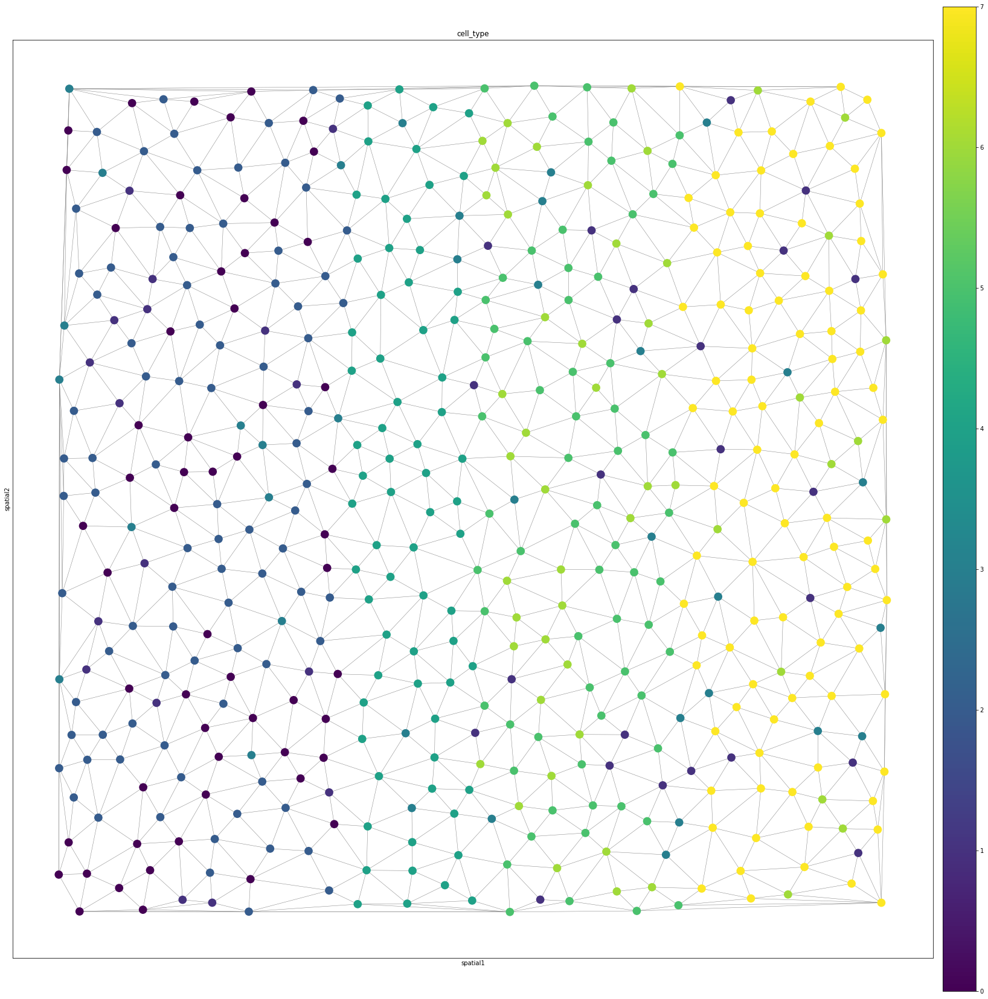

In [68]:
fig, ax = plt.subplots(figsize=(30,30))
sq.gr.spatial_neighbors(loaded_datasets[0], delaunay=True, coord_type="generic")
sc.pl.spatial(
    loaded_datasets[0],
    color="cell_type",
    neighbors_key="spatial_neighbors",
    spot_size=0.01,
    edges=True,
    edges_width=0.5,
    # img_key="segmentation",
    # alpha_img=0.5,
    ax=ax
)

In [69]:
loaded_datasets[0].uns["ground_truth_X"]["0"] @ loaded_datasets[0].uns["ground_truth_M"]["0"].T

array([[0.07662859, 0.12592046, 0.23022521, ..., 0.12997699, 0.08279287,
        0.15760359],
       [0.06604731, 0.12636562, 0.16340016, ..., 0.04598662, 0.11275423,
        0.10191156],
       [0.06395122, 0.10903323, 0.19956722, ..., 0.11482448, 0.07145133,
        0.13808375],
       ...,
       [0.05057417, 0.06247436, 0.11719459, ..., 0.05433794, 0.05298672,
        0.0581387 ],
       [0.06500668, 0.07835646, 0.14609291, ..., 0.06633231, 0.06466159,
        0.07398077],
       [0.07984358, 0.11482139, 0.22283325, ..., 0.11500073, 0.11231767,
        0.0980176 ]])

In [70]:
loaded_datasets[0].X

array([[0.67676   , 1.4879402 , 1.7273189 , ..., 1.2340802 , 0.99024177,
        0.22809485],
       [0.38261873, 0.16159742, 0.80356216, ..., 0.22940274, 0.3368963 ,
        0.7964293 ],
       [0.5198801 , 0.1569591 , 0.69054365, ..., 0.07602958, 0.18613382,
        1.0260576 ],
       ...,
       [1.4178607 , 0.52156126, 0.93837285, ..., 0.68324035, 0.6021887 ,
        0.01939524],
       [0.80953866, 0.36649638, 1.3576732 , ..., 0.02720609, 0.31638402,
        2.096648  ],
       [0.6359376 , 1.0111884 , 0.6380394 , ..., 1.0092461 , 0.7883816 ,
        1.6778986 ]], dtype=float32)

[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


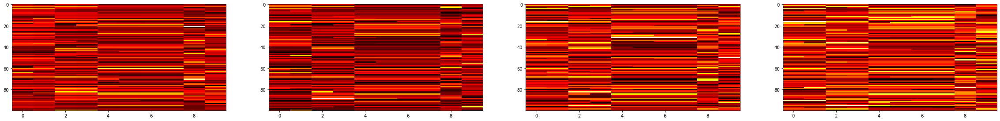

In [71]:
fig, axes = plt.subplots(1, 4, figsize=(40, 12))
for replicate, ax in zip(range(parameters["num_replicates"]), axes):
    metagenes = loaded_datasets[0].uns["ground_truth_M"][f"{replicate}"]
    ax.imshow(metagenes, cmap='hot', interpolation='nearest', aspect=0.05)
    print(metagenes.sum(axis=0))

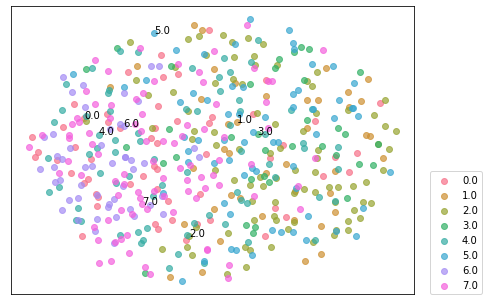

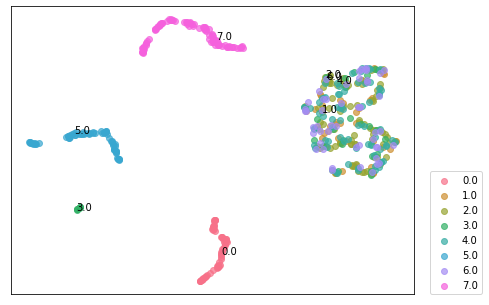

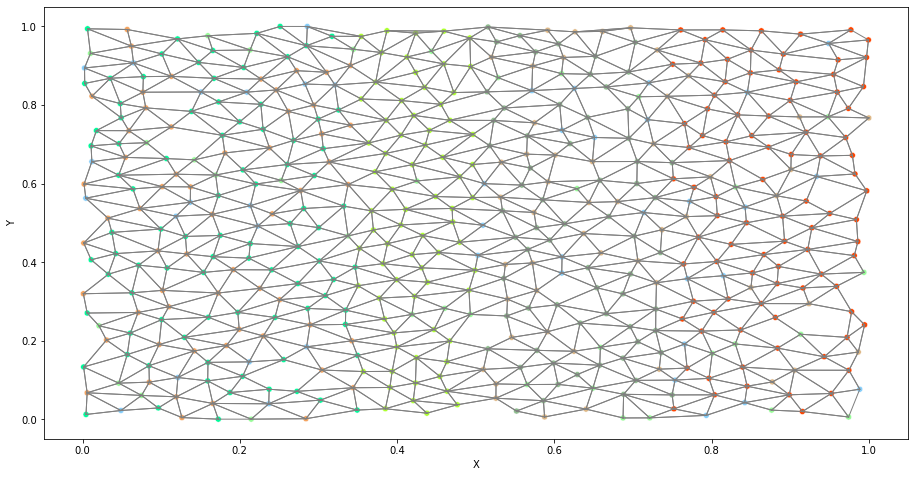

In [63]:
replicate = 1
for dataset in datasets[:1]:
    dataset.plot_cells_UMAP(latent_space=False, annotate=True, replicate=replicate)
    dataset.plot_cells_UMAP(latent_space=True, annotate=True, replicate=replicate)
    dataset.plot_cell_types(replicate=replicate)

In [29]:
for dataset in datasets:
    print(dataset.cell_type_definitions)
    dataset.plot_feature_by_cell_type(s=0.4)

[[[0 0 0 0 0 0 1 0]
  [0 0 0 0 0 0 0 0]
  [0 0 0 0 0 0 0 0]
  [0 0 0 0 0 0 0 0]
  [1 0 0 0 0 0 0 0]
  [0 0 0 0 0 0 0 0]
  [0 0 0 1 0 0 0 0]
  [0 0 1 0 0 0 0 0]]

 [[0 0 0 0 0 0 0 0]
  [0 0 0 0 0 0 0 1]
  [0 0 0 0 0 0 0 0]
  [0 0 0 0 0 0 0 0]
  [0 0 0 0 0 0 0 0]
  [0 0 0 0 0 0 0 0]
  [0 0 0 0 0 0 0 0]
  [0 0 1 0 0 0 0 0]]

 [[0 0 0 0 0 0 0 0]
  [0 0 0 0 0 0 0 0]
  [0 0 0 0 1 0 0 0]
  [0 0 0 0 0 0 0 0]
  [1 0 0 0 0 0 0 0]
  [0 1 0 0 0 0 0 0]
  [0 0 0 0 0 0 0 0]
  [0 0 1 0 0 0 0 0]]

 [[0 0 0 0 0 0 0 0]
  [0 0 0 0 0 0 0 0]
  [0 0 0 0 0 0 0 0]
  [0 0 0 0 0 1 0 0]
  [1 0 0 0 0 0 0 0]
  [0 1 0 0 0 0 0 0]
  [0 0 0 0 0 0 0 0]
  [0 0 1 0 0 0 0 0]]]


AttributeError: 'SyntheticCortexDataset' object has no attribute 'plot_feature_by_cell_type'

In [ ]:
rng = np.random.default_rng(12345)

num_genes = 2
num_cells = 100000
random_integers = rng.integers(low=0, high=1, size=num_genes)
random_values = np.zeros((num_cells, num_genes))
covariance_matrix = 0.05 * np.identity(num_genes)
covariance_matrix[0, 1], covariance_matrix[1, 0] = 0.02, 0.00
for cell in range(num_cells):
    random_values[cell] = sample_gaussian(covariance_matrix, random_integers)

In [ ]:
import matplotlib.pyplot as plt
x, y = random_values.T
plt.scatter(x, y)

In [ ]:
rng = np.random.default_rng(12345)

num_genes = 100
num_cells = 2000
random_integers = rng.integers(low=10, high=20, size=num_genes)
covariance_matrix = 25 * np.identity(num_genes)
covariance_matrix[0, 1], covariance_matrix[1, 0] = 0.02, 0.02
random_values = sample_truncated_gaussian(covariance_matrix, random_integers, num_cells, num_steps=1000)

In [ ]:
import matplotlib.pyplot as plt
x, y = random_values.T[:2]
plt.scatter(x, y)

## Loading up old simulation data as AnnData

In [1590]:
save_anndata

<function load_data.save_anndata(filepath, datasets, replicate_names)>

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


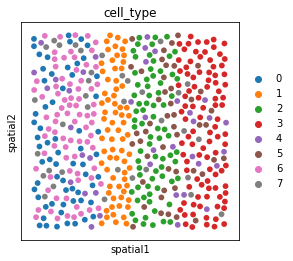

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


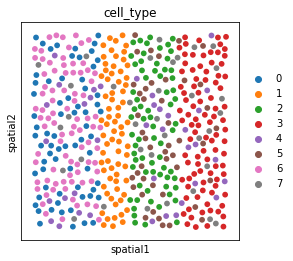

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


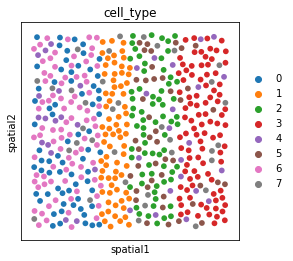

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


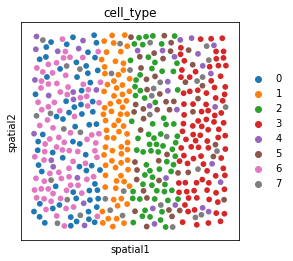

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


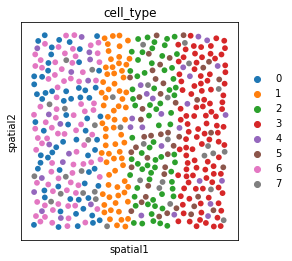

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


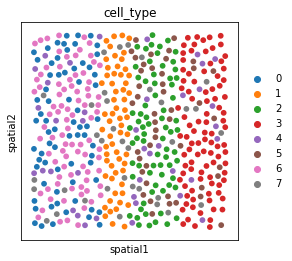

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


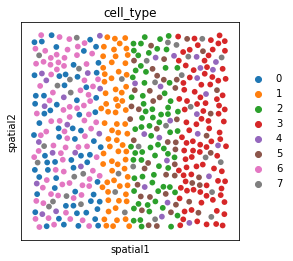

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


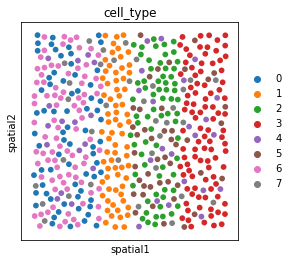

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


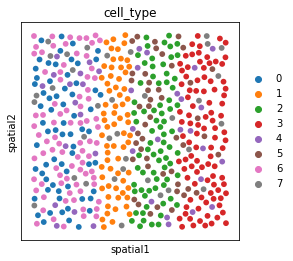

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


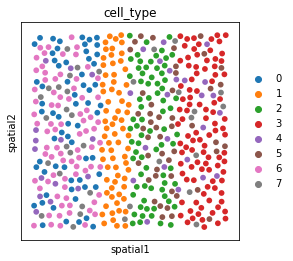

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


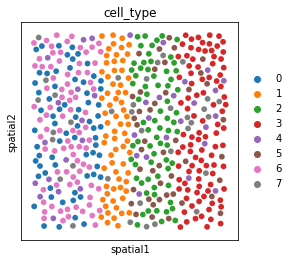

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


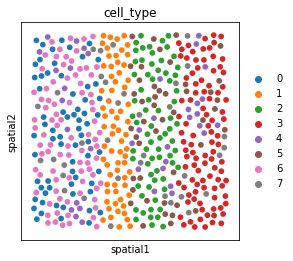

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


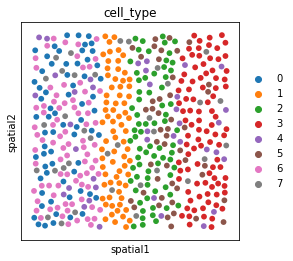

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


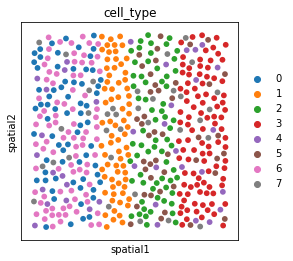

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


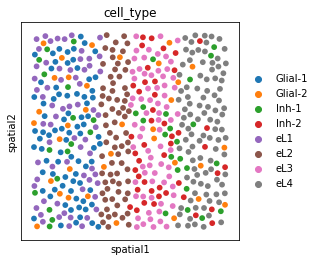

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


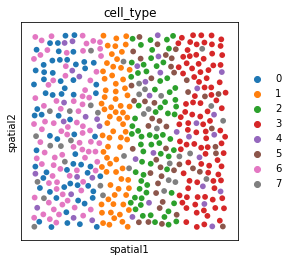

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


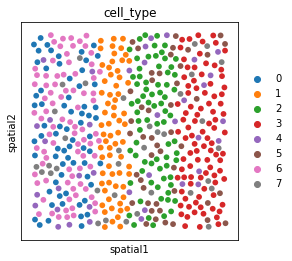

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


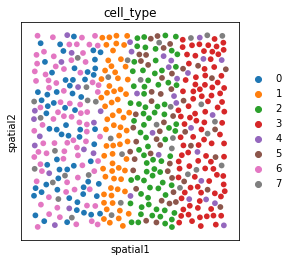

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


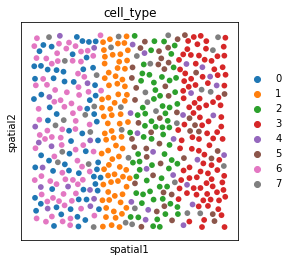

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


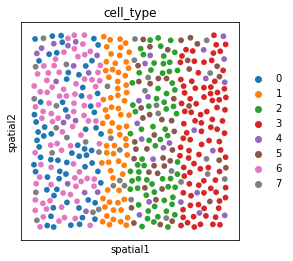

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


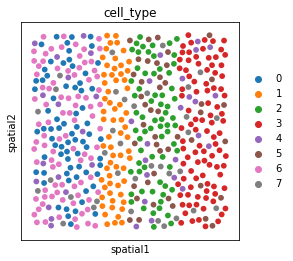

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


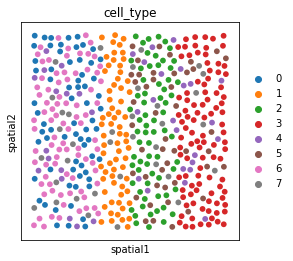

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


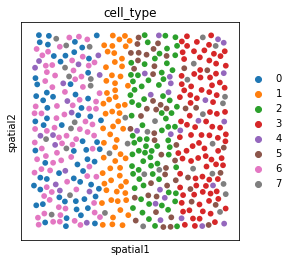

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


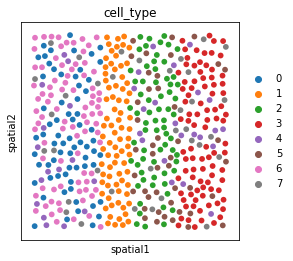

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


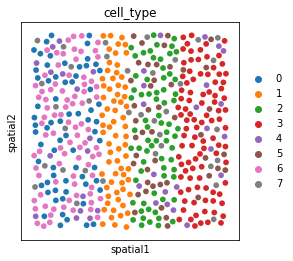

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


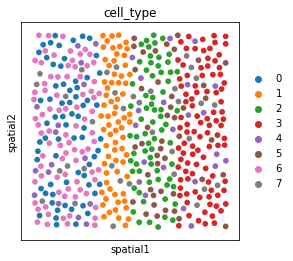

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


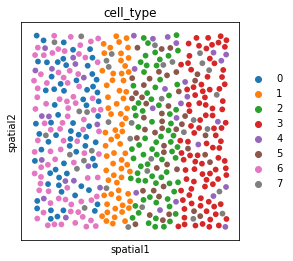

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


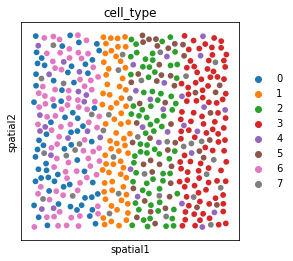

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


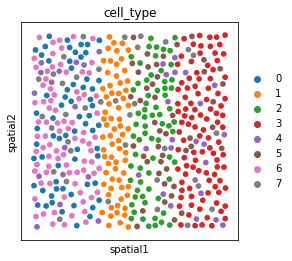

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


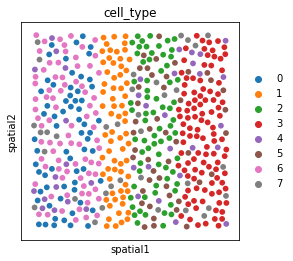

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


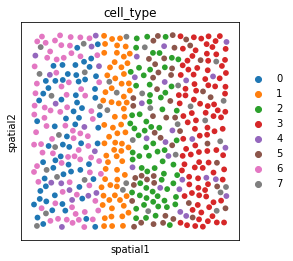

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


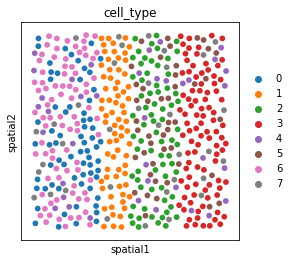

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


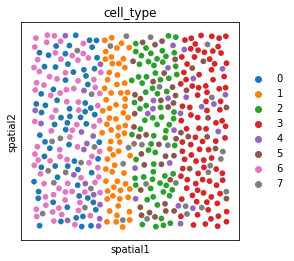

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


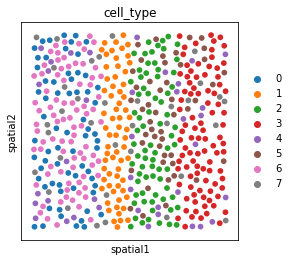

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


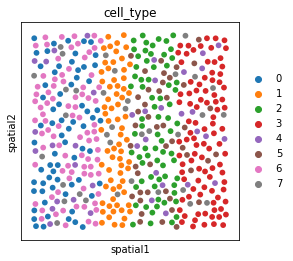

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


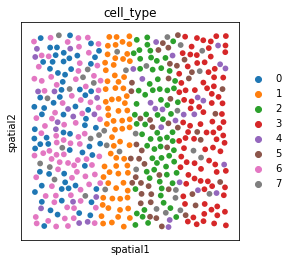

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


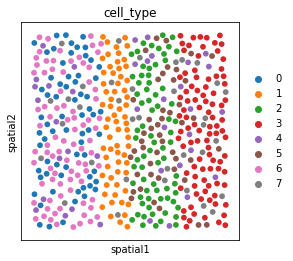

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


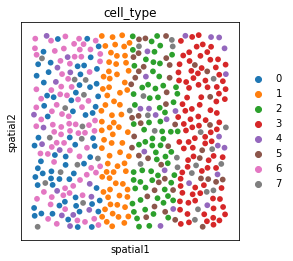

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


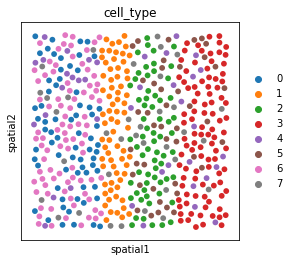

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


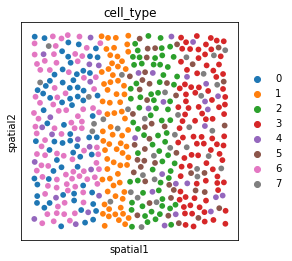

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


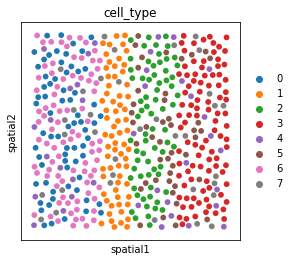

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


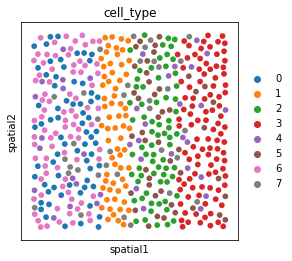

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


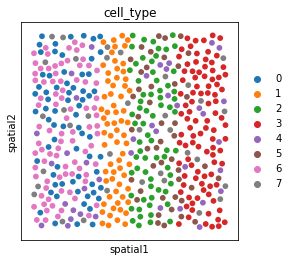

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


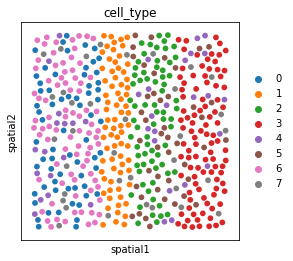

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


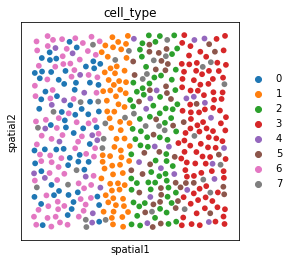

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


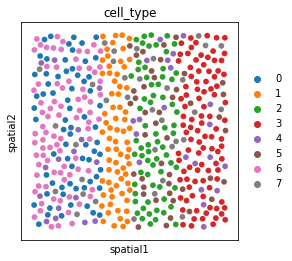

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


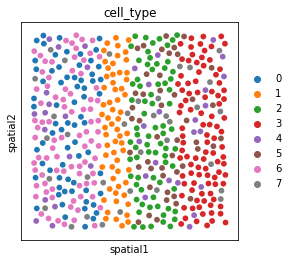

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


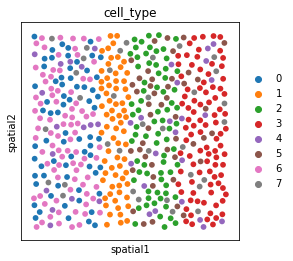

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


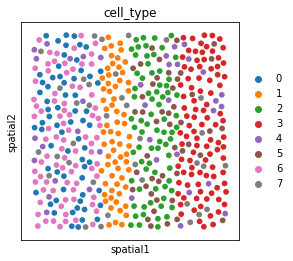

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


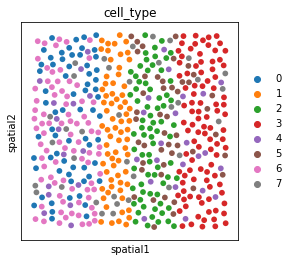

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


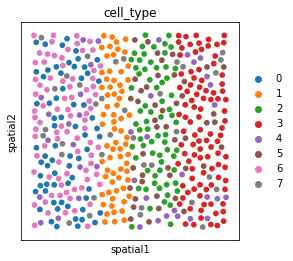

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


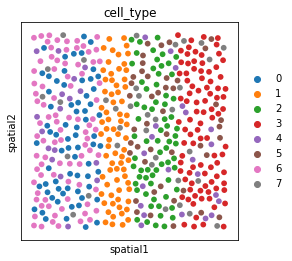

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


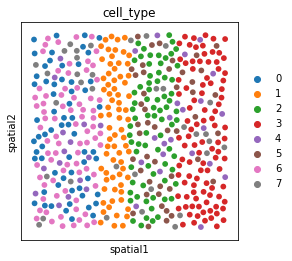

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


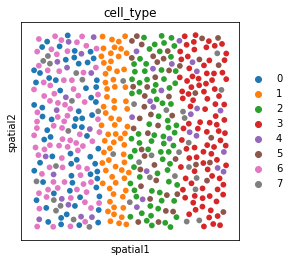

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


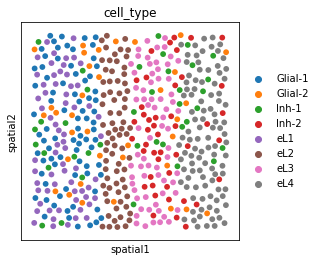

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


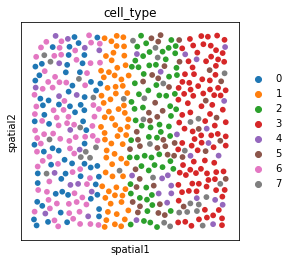

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


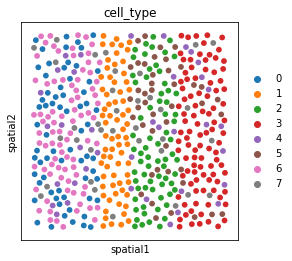

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


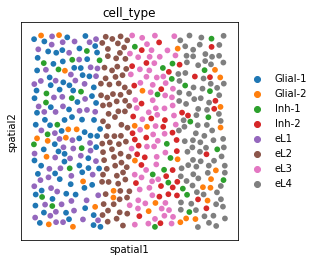

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


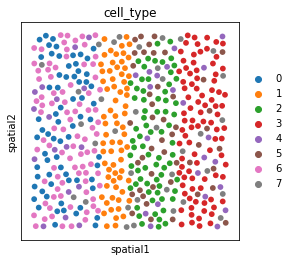

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


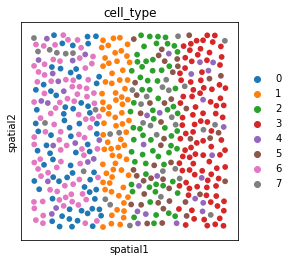

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


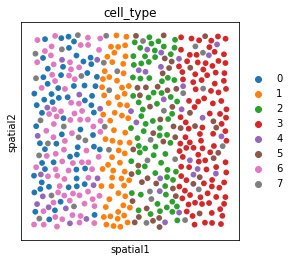

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


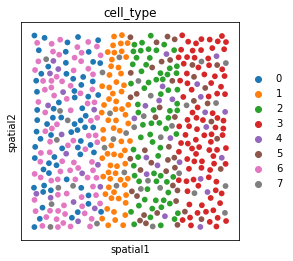

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


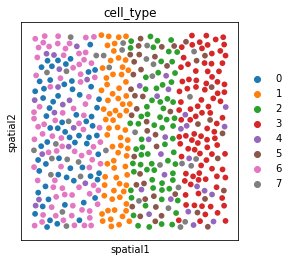

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


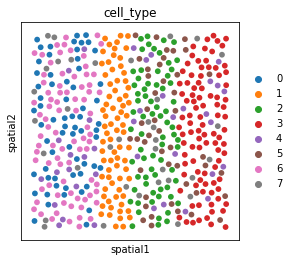

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


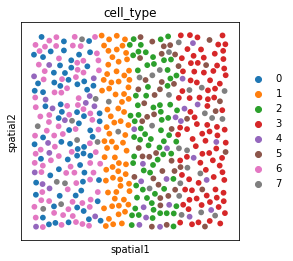

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


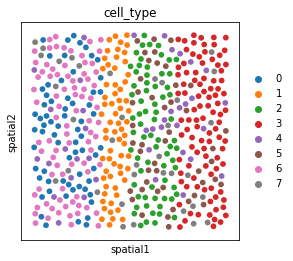

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


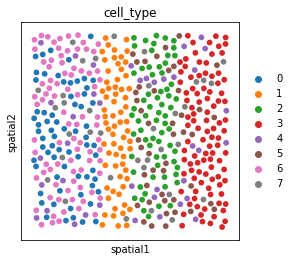

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


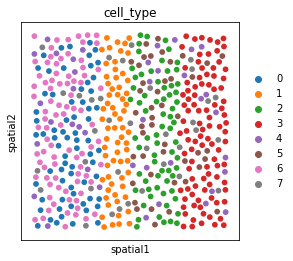

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


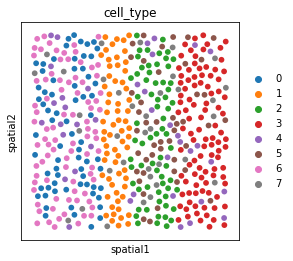

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


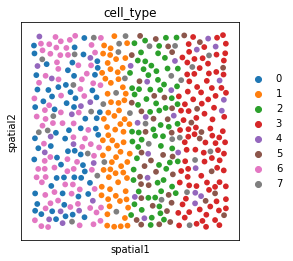

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


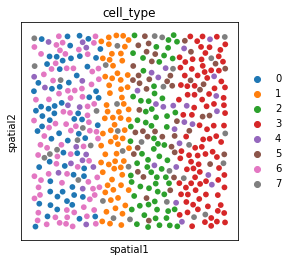

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


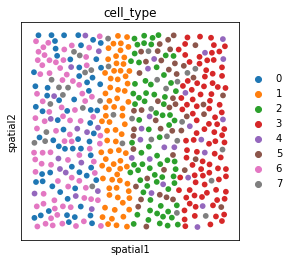

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


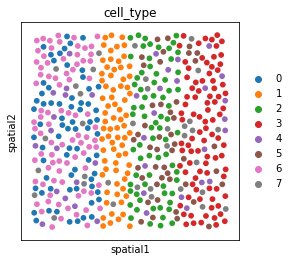

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


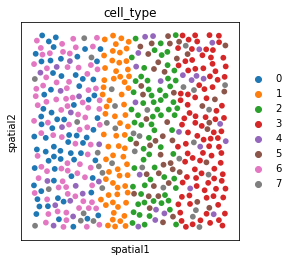

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


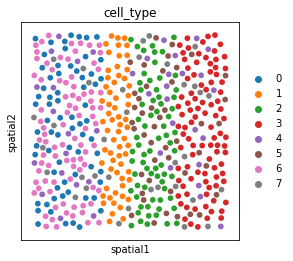

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


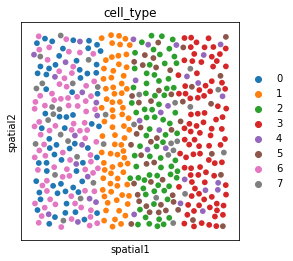

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


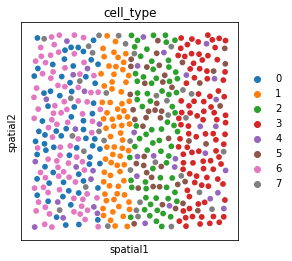

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


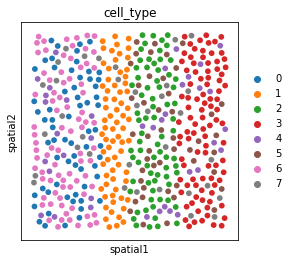

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


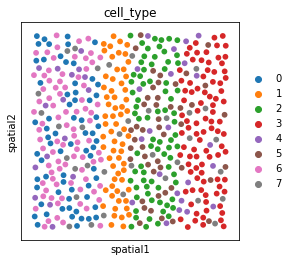

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


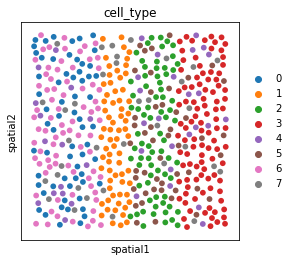

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


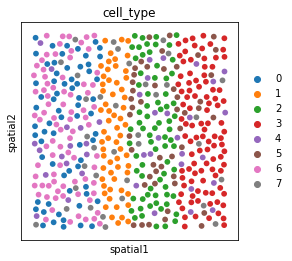

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


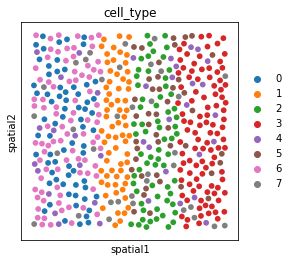

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


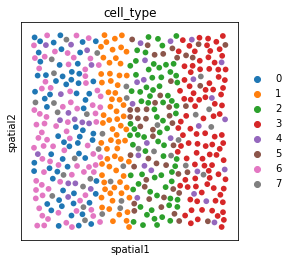

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


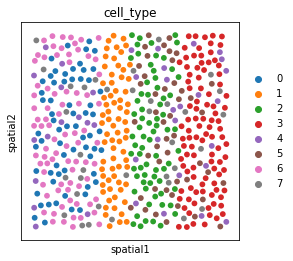

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


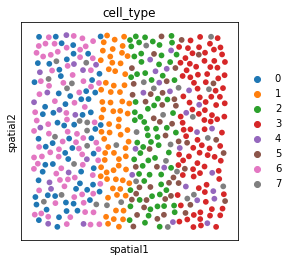

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


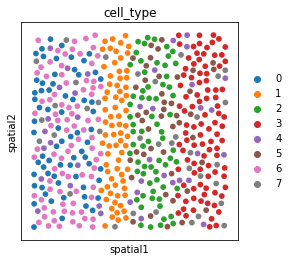

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


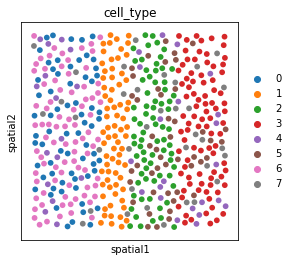

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


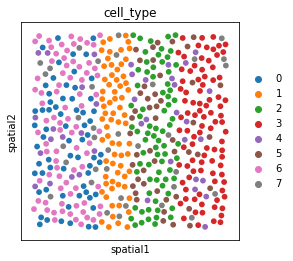

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


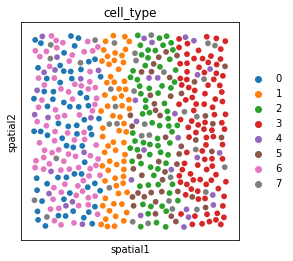

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


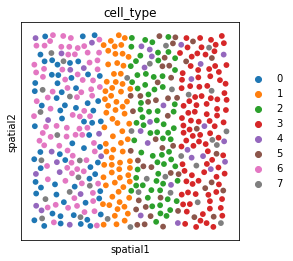

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


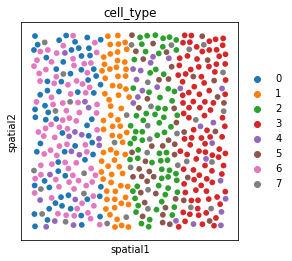

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


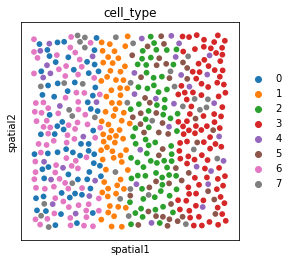

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


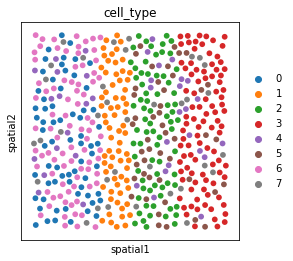

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


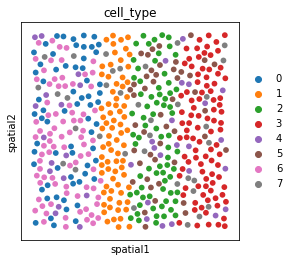

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


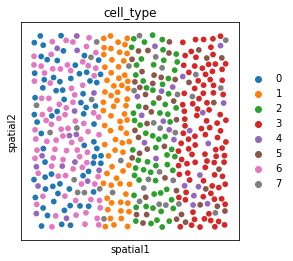

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


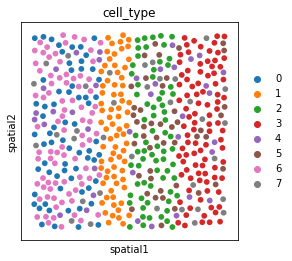

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


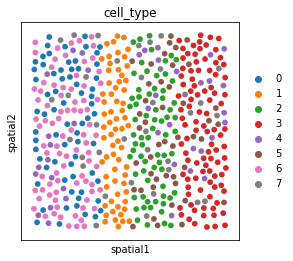

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


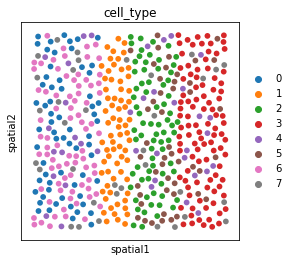

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


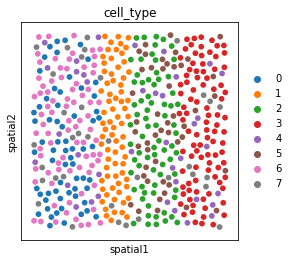

/home/shahula/bin/miniconda3/envs/spicemix/lib/python3.7/site-packages/ipykernel_launcher.py:11: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  # This is added back by InteractiveShellApp.init_path()


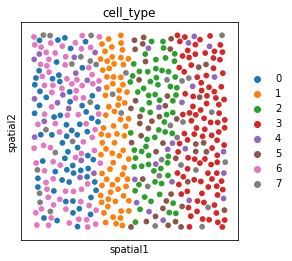

In [1598]:
old_simulation_directory = Path("/work/magroup/tianming/Researches/SpiceMix/version1/data/obsolete/")
new_simulation_directory = Path("../../data/synthetic_cortex/old")
for subdirectory in sorted(old_simulation_directory.glob("synthetic_500_100_*_*_0_0_i*")):
    dataset_name = subdirectory.stem
    
    expression = np.loadtxt(subdirectory / "files" / "expression_0.txt")
    coordinates = np.loadtxt(subdirectory / "files" / "coordinates_0.txt")
    ground_truth_X = np.loadtxt(subdirectory / "files" / "truth_X_0.txt")
    cell_types = np.loadtxt(subdirectory / "files" / "celltypes_0.txt", dtype=str)
    
    simulated_dataset = ad.AnnData(X=expression)
    simulated_dataset.obsm["spatial"] = coordinates
    simulated_dataset.obsm["ground_truth_X"] = ground_truth_X
    simulated_dataset.obs["cell_type"] = cell_types
    
    sq.gr.spatial_neighbors(simulated_dataset, coord_type="generic", delaunay=True)
    simulated_dataset.obsp["spatial_connectivities"] = remove_connectivity_artifacts(simulated_dataset.obsp["spatial_distances"])
    simulated_dataset.obsp["adjacency_matrix"] = simulated_dataset.obsp["spatial_connectivities"]
    
    sc.pl.spatial(simulated_dataset, color="cell_type", spot_size=0.03)
    replicate_names = ["0"]
    datasets = [simulated_dataset]
    
    (new_simulation_directory / dataset_name).mkdir(parents=True, exist_ok=True)
    save_anndata(new_simulation_directory / dataset_name / "processed_dataset.h5ad", datasets, replicate_names)